In [1]:
#Import

import numpy as np
import matplotlib.pyplot as plt
from multipole_signal import Derivatives
from getdist import plots
from getdist.gaussian_mixtures import GaussianND
import fishermat as fm
import pickle as pk

#Set current directory
import os
import sys

PACKAGE_PARENT = '..'
SCRIPT_DIR = os.path.dirname(os.path.realpath(os.path.join(os.getcwd())))
sys.path.append(SCRIPT_DIR)
print(SCRIPT_DIR)

#Configuration
large = 22; med = 16; small = 12
params = {'axes.titlesize': large,
          'legend.fontsize': med,
          'axes.labelsize': med,
          'axes.titlesize': med,
          'xtick.labelsize': med,
          'ytick.labelsize': med,
          'figure.titlesize': large,
          'xtick.direction': 'out',  
          'ytick.direction': 'out',  
          'xtick.minor.visible': True,  
          'ytick.minor.visible': True,
          'xtick.major.size': 9,
          'xtick.minor.size': 4.5,
          'ytick.major.size': 9,
          'ytick.minor.size': 4.5,
          'lines.linewidth': 1.75}
plt.rcParams.update(params)

plt.rcParams['text.usetex'] = True
plt.rcParams['font.family'] = 'serif'

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

/Users/danielsb/Documents/GitHub


In [2]:
# Redshift bins

z_bins = np.array([ 0.15, 0.25, 0.35, 0.45, 0.55, 0.65, 0.75, 0.85, 0.95, 1.05, 1.15, 1.25, 1.35, 1.45, 1.55, 1.65, 1.75, 1.85, 1.95 ])

#z_bins = np.array([ 0.15, 0.25, 0.35, 0.45, 0.55, 0.65, 0.75, 0.85, 0.95, 1.05, 1.15, 1.25, 1.35, 1.45, 1.55 ])


# Separations

dist = [
    np.arange(20, 164, 4),
    np.arange(32, 164, 4),
]

params_dict0 = {
    'h' : 0.677,
    'As' : 2.05e-9,
    'ns' : 0.965,
    'Ob' : 0.0490, # This is here the density parameter of Baryons
    'Om' : 0.3111, # This is here the density parameter of Cold Dark Matter
}

steps = [1e-3, 1e-1, 1e-4, 1e-2, 1e-2]

# JOINT ANALYSIS. 

### 50x50 vs 30x70 SPLITTINGS.

We run the analysis combining two different population splittings, combining the information as if they were two independent experiments. We include the cross correlations between the observables but assume the parameters of each population are independent. The signal looks like:

$$ \vec{\xi}(z,d) = (\{\xi_l^{\mathrm{LM}}(z,d)\}_{l=0,1,2,4}, \{\xi_l^{\mathrm{NP}}(z,d)\}_{l=0,1,2,4}) $$



## Derivatives (LOAD FROM FILE)

In [3]:
with open('derivatives.pkl', 'rb') as File:
    derivatives_dict = pk.load(File)
    
derivatives_50x50 = derivatives_dict['split_50x50']
derivatives_30x70 = derivatives_dict['split_30x70']

In [4]:
dsignal_dsbias50 = derivatives_50x50['dsignal_dsbias']

dsignal_dgbias50 = derivatives_50x50['dsignal_dgbias']

dsignal_dcosmic50 = derivatives_50x50['dsignal_dcosmic']

dsignal_dnum50 = derivatives_50x50['dsignal_dnumev']

np.shape(dsignal_dsbias50), np.shape(dsignal_dgbias50), np.shape(dsignal_dcosmic50), np.shape(dsignal_dnum50)

((8, 19, 324), (4, 19, 324), (5, 19, 324), (4, 19, 324))

In [5]:
dsignal_dsbias30 = derivatives_30x70['dsignal_dsbias']

dsignal_dgbias30 = derivatives_30x70['dsignal_dgbias']

dsignal_dcosmic30 = derivatives_30x70['dsignal_dcosmic']

dsignal_dnum30 = derivatives_30x70['dsignal_dnumev']

np.shape(dsignal_dsbias30), np.shape(dsignal_dgbias30), np.shape(dsignal_dcosmic30), np.shape(dsignal_dnum30)

((8, 19, 324), (4, 19, 324), (5, 19, 324), (4, 19, 324))

In [6]:
dsignal_dtheta50 = np.concatenate([dsignal_dsbias50, dsignal_dnum50, dsignal_dgbias50, dsignal_dcosmic50])

np.shape(dsignal_dtheta50)

(21, 19, 324)

In [7]:
dsignal_dtheta30 = np.concatenate([dsignal_dsbias30, dsignal_dnum30, dsignal_dgbias30, dsignal_dcosmic30])

np.shape(dsignal_dtheta30)

(21, 19, 324)

REMOVE HEXADECAPOLE FROM 50x50 split

In [8]:
n_sep = len(dist[0])
n_signals = int(len(dsignal_dtheta50[0,0])/n_sep)
ind_to_remove = list(range(7*n_sep,8*n_sep))

print('Number of separations = ', n_sep)
print('Number of signals = ', n_signals)
print('Indices to remove = ', ind_to_remove)

Number of separations =  36
Number of signals =  9
Indices to remove =  [252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287]


In [9]:
dsignal_dsB50 = np.concatenate([dsignal_dsbias50[:4], np.zeros_like(dsignal_dsbias50[:4])], axis=2)
dsignal_dsB30 = np.concatenate([np.zeros_like(dsignal_dsbias30[:4]), dsignal_dsbias30[:4]], axis=2)

dsignal_dsM = np.concatenate([dsignal_dsbias50[4:], dsignal_dsbias30[4:]], axis=2)
dsignal_dnum = np.concatenate([dsignal_dnum50, dsignal_dnum30], axis=2)
dsignal_dgbias50 = np.concatenate([dsignal_dgbias50, np.zeros_like(dsignal_dgbias50[:4])], axis=2)
dsignal_dgbias30 = np.concatenate([np.zeros_like(dsignal_dgbias30[:4]), dsignal_dgbias30], axis=2)
dsignal_dcosmic = np.concatenate([dsignal_dcosmic50, dsignal_dcosmic30], axis=2)

In [10]:
dsignal_dtheta_multi_ = np.concatenate([dsignal_dsB50, dsignal_dsB30, dsignal_dsM, dsignal_dnum, dsignal_dgbias50, dsignal_dgbias30, dsignal_dcosmic])

dsignal_dtheta_multi = np.delete(dsignal_dtheta_multi_, ind_to_remove, axis=2)


np.shape(dsignal_dtheta_multi_), np.shape(dsignal_dtheta_multi)

((29, 19, 648), (29, 19, 612))

## Covariance Matrix

In [11]:
# Create the PRIORS Cov Matrix for sB, sM, num

errB = [5e-1, 5e-1] 
errF = [5e-1, 5e-1]

num_fit = np.array([7.94599872, -12.03752386, 2.29927261, -15.83887364])

sB_4fit50 = np.array([-0.90110745,  1.82300205, -1.01878441, -0.30342325])
sB_4fit30 = np.array([0.32517601, 0.64417733, 0.16141876, 0.13330362])

sM_4fit = np.array([-0.19376092,  1.07473357, -0.07806244, -0.00558004])

dsB_50 = sB_4fit50 * errB[0] 
dsB_30 = sB_4fit30 * errB[0] 

dsM = sM_4fit * errF[0]

dnum = num_fit * errB[1]

Cov_prior_all = np.diag(np.concatenate([dsB_50**2, dsB_30**2, dsM**2, dnum**2]))

Inv_Cov_prior_all_ = np.linalg.inv(Cov_prior_all)

Inv_Cov_prior_all = np.zeros([len(dsignal_dtheta_multi), len(dsignal_dtheta_multi)])
Inv_Cov_prior_all[:len(Inv_Cov_prior_all_), :len(Inv_Cov_prior_all_)] = Inv_Cov_prior_all_

np.shape(Cov_prior_all), np.shape(Inv_Cov_prior_all)

((16, 16), (29, 29))

In [12]:
Cov_Multipoles_Joint50x30_ = fm.cov_matrix_joint(d=dist[0], z_bins=z_bins, small_off_diagonal=True, splits=[50,30], rtol=1e-4, contributions='all')

print('\n ... Remove the HEXADECAPOLE from 50x50 split ... \n')

Cov_Multipoles_Joint50x30 = np.delete(Cov_Multipoles_Joint50x30_, ind_to_remove, axis=1)
Cov_Multipoles_Joint50x30 = np.delete(Cov_Multipoles_Joint50x30, ind_to_remove, axis=2)

np.shape(Cov_Multipoles_Joint50x30_), np.shape(Cov_Multipoles_Joint50x30)


 ... Loading Covariance Matrices (Joint-splittings Analysis) [all] [MONOBB, MONOBF, MONOFF, DIPBF, QUADBB, QUADBF, QUADFF, HEXAT, OCTBF] ... 


 ... Remove the HEXADECAPOLE from 50x50 split ... 



((19, 648, 648), (19, 612, 612))

In [13]:
# Check if Cov Matrices are symmetric:

for n, z in enumerate(z_bins):
    print(n, np.allclose(Cov_Multipoles_Joint50x30_[n], Cov_Multipoles_Joint50x30_[n].T, rtol = 1e-15), np.allclose(Cov_Multipoles_Joint50x30[n], Cov_Multipoles_Joint50x30[n].T, rtol = 1e-15))

0 True True
1 True True
2 True True
3 True True
4 True True
5 True True
6 True True
7 True True
8 True True
9 True True
10 True True
11 True True
12 True True
13 True True
14 True True
15 True True
16 True True
17 True True
18 True True


In [14]:
# Load the Covariance Matrix of the multipoles

Inv_Cov_Multipoles_Joint50x30_ = np.linalg.pinv(Cov_Multipoles_Joint50x30)

# Symmetrize the matrix

Inv_Cov_Multipoles_Joint50x30 = [0.5 * (Inv_Cov_Multipoles_Joint50x30_[i] + Inv_Cov_Multipoles_Joint50x30_[i].T) for i in range(len(z_bins))]

In [15]:
# Check if Inverse Cov Matrices are symmetric:

for n, z in enumerate(z_bins):
    print(n, np.allclose(Inv_Cov_Multipoles_Joint50x30_[n], Inv_Cov_Multipoles_Joint50x30_[n].T, rtol = 1e-1), np.allclose(Inv_Cov_Multipoles_Joint50x30[n], Inv_Cov_Multipoles_Joint50x30[n].T, rtol = 1e-3))

0 False True
1 False True
2 False True
3 False True
4 False True
5 False True
6 False True
7 False True
8 False True
9 False True
10 False True
11 False True
12 False True
13 False True
14 False True
15 False True
16 False True
17 False True
18 False True


In [16]:
# Build the Fisher Matrix

Fisher_Matrix_Joint50x30_ = fm.fisher_matrix(d_signal = dsignal_dtheta_multi, inv_cov = Inv_Cov_Multipoles_Joint50x30, z_bins = z_bins)
Fisher_Matrix_Joint50x30 = Fisher_Matrix_Joint50x30_ + Inv_Cov_prior_all

np.shape(Fisher_Matrix_Joint50x30)


 ... Computing the Fisher Matrix ... 

Signal & Cov must be given as functions (z,d) and (z,d,d') respectively. 


 ... Success! ... 



(29, 29)

In [17]:
print('\n'.join(['\t'.join([str(cell) for cell in row]) for row in Fisher_Matrix_Joint50x30[:8,:8]]))

69696.26137983051	27175.013745558415	-87703.53466469221	151776.3021924484	-30000.789336363763	-10727.567101658262	40833.40197884047	-73097.99221611724
27175.01374555843	18172.889594233504	-17158.170873611434	26072.935820846444	-10727.56710165826	-7038.9568586958285	7349.106686023991	-11950.934214825664
-87703.53466469227	-17158.170873611438	151780.15604780192	-276821.75520268094	40833.401978840455	7349.106686023992	-73097.99221611723	135617.6181537829
151776.3021924485	26072.935820846455	-276821.75520268094	517383.1282924776	-73097.99221611724	-11950.934214825671	135617.61815378294	-255570.0293223151
-30000.789336363763	-10727.56710165826	40833.401978840455	-73097.99221611724	21500.991655515325	8245.190702314996	-27825.806213925815	49296.39598573812
-10727.56710165826	-7038.956858695828	7349.106686023989	-11950.934214825667	8245.190702315	5720.390557198764	-5083.752393713381	8245.972801189513
40833.40197884045	7349.106686023991	-73097.99221611724	135617.61815378294	-27825.806213925833	

In [18]:
print('\n'.join(['\t'.join([str(cell) for cell in row]) for row in Fisher_Matrix_Joint50x30[8:16,8:16]]))

74449.8168821403	39207.58476307654	-57887.21857507478	66757.6483293659	2324.647924003051	1145.4502002274426	6144.563861764806	1462.2699571222101
39207.58476307657	26428.730453364682	-19948.59348909476	19773.559067107068	1145.4502002274435	712.8009729076258	2324.647924003052	638.9227473994576
-57887.21857507477	-19948.593489094746	67414.05917405449	-88386.13074271081	-1943.8116089148205	-669.9176350906827	-6813.779630963097	-1389.6511509433944
66757.64832936581	19773.55906710705	-88386.13074271083	259287.9536913425	2244.6985338009918	659.6928936515366	9230.735842896594	1688.02057337067
2324.6479240030517	1145.4502002274435	-1943.811608914822	2244.6985338009927	90.25070314833195	41.76921671350524	248.90227468649746	58.169830343096145
1145.450200227443	712.8009729076257	-669.9176350906827	659.692893651537	41.769216713505216	24.21059750841028	90.18735075741188	24.19441906336279
6144.563861764805	2324.6479240030526	-6813.779630963103	9230.735842896593	248.90227468649746	90.18735075741195	87

In [19]:
print('\n'.join(['\t'.join([str(cell) for cell in row]) for row in Fisher_Matrix_Joint50x30[16:,16:]]))

373981855.0899109	67982930.2536236	261438172.28425732	33960600.671478726	-234483595.78892097	-43706404.782127745	-407915916.55721194	-59252382.84657715	680040.4234732151	310316.26516050554	-193943.54625183906	-2216836.1933322786	516224.4514823803
67982930.25362362	17957476.90079264	33960600.671478726	4493813.957168898	-43706404.78212775	-11857194.061844952	-59252382.84657718	-10636520.770776017	459608.6756820755	202347.35649697352	-104897.3918558995	-1513513.3186042602	96219.36867724684
261438172.28425732	33960600.67147873	326126133.44192034	52470312.39583661	-156617174.82143876	-20629266.06308195	-422770538.2874158	-62726247.69483004	1943002.5226327726	595879.3150843541	375381.6379195583	-7255638.38975346	7053177.080582264
33960600.671478726	4493813.9571688995	52470312.39583662	11616310.250936124	-20629266.063081942	-2904219.8297042903	-62726247.694830015	-11783419.678722132	723763.5794557162	238199.38376909724	89095.49351263719	-2648020.15447259	1667888.8032863373
-234483595.788921	-

In [20]:
print('\n'.join(['\t'.join([str(cell) for cell in row]) for row in Fisher_Matrix_Joint50x30[16:24,16:24]]))

373981855.0899109	67982930.2536236	261438172.28425732	33960600.671478726	-234483595.78892097	-43706404.782127745	-407915916.55721194	-59252382.84657715
67982930.25362362	17957476.90079264	33960600.671478726	4493813.957168898	-43706404.78212775	-11857194.061844952	-59252382.84657718	-10636520.770776017
261438172.28425732	33960600.67147873	326126133.44192034	52470312.39583661	-156617174.82143876	-20629266.06308195	-422770538.2874158	-62726247.69483004
33960600.671478726	4493813.9571688995	52470312.39583662	11616310.250936124	-20629266.063081942	-2904219.8297042903	-62726247.694830015	-11783419.678722132
-234483595.788921	-43706404.78212774	-156617174.82143873	-20629266.063081957	153408688.55666453	30596955.79998596	237029777.68635386	33029000.998728458
-43706404.78212774	-11857194.06184495	-20629266.063081942	-2904219.8297042926	30596955.79998596	9066883.150075346	33029000.998728443	5346611.689685709
-407915916.55721194	-59252382.84657716	-422770538.2874157	-62726247.694830015	237029777.

In [21]:
print('\n'.join(['\t'.join([str(cell) for cell in row]) for row in Fisher_Matrix_Joint50x30[24:,24:]]))

9182006.204307172	2976049.211948083	992490.4113932454	-34543302.11891342	11812299.830871304
2976049.211948044	1025353.2324248665	221384.91071020073	-10731655.552210193	3777174.5479220287
992490.411393274	221384.91071019223	452383.27896581375	-3798775.1359797716	2361044.127039284
-34543302.11891404	-10731655.552210534	-3798775.135979568	141802002.46669024	-42404711.67049617
11812299.8308712	3777174.5479219165	2361044.127039363	-42404711.67049541	22846947.209211633


In [22]:
print(np.allclose(Fisher_Matrix_Joint50x30, Fisher_Matrix_Joint50x30.T, rtol=1e-6))

True


In [23]:
print(np.allclose(Fisher_Matrix_Joint50x30[:-5,:-5], Fisher_Matrix_Joint50x30[:-5,:-5].T, rtol=1e-6))

True


In [24]:
np.linalg.det(Fisher_Matrix_Joint50x30)

3.612082035955901e+124

In [25]:
Fisher_Matrix_Joint50x30__ = 0.5 * (Fisher_Matrix_Joint50x30 + Fisher_Matrix_Joint50x30.T)

In [26]:
print('\n'.join(['\t'.join([str(cell) for cell in row]) for row in Fisher_Matrix_Joint50x30__[16:,16:]]))

373981855.0899109	67982930.2536236	261438172.28425732	33960600.671478726	-234483595.788921	-43706404.78212774	-407915916.55721194	-59252382.84657716	680040.4234731409	310316.26516049687	-193943.54625180003	-2216836.1933322474	516224.4514824044
67982930.2536236	17957476.90079264	33960600.67147873	4493813.957168899	-43706404.782127745	-11857194.061844952	-59252382.84657717	-10636520.770776015	459608.6756820803	202347.356496975	-104897.39185590715	-1513513.3186043026	96219.36867725533
261438172.28425732	33960600.67147873	326126133.44192034	52470312.395836614	-156617174.82143873	-20629266.063081946	-422770538.28741574	-62726247.694830045	1943002.5226328645	595879.3150843303	375381.6379195723	-7255638.389753485	7053177.080582297
33960600.671478726	4493813.957168899	52470312.395836614	11616310.250936124	-20629266.06308195	-2904219.829704291	-62726247.694830015	-11783419.678722136	723763.5794557306	238199.38376909032	89095.49351263716	-2648020.154472578	1667888.8032863305
-234483595.788921	-4

In [27]:
np.linalg.det(Fisher_Matrix_Joint50x30[:-5, :-5])

1.159835825387323e+96

In [28]:
np.linalg.det(Fisher_Matrix_Joint50x30__[:-5, :-5])

1.1598358253869604e+96

In [29]:
np.linalg.det(Fisher_Matrix_Joint50x30__)

3.6120820359567226e+124

In [30]:
np.linalg.det(Fisher_Matrix_Joint50x30)

3.612082035955901e+124

## Constraints

In [31]:
#Absolute Errors

Sigma_Matrix_Joint50x30 = np.linalg.inv(Fisher_Matrix_Joint50x30)

Abs_Errors_all_Joint = np.sqrt(np.diag(Sigma_Matrix_Joint50x30))

# Fiducial values

sB_fit = np.concatenate([sB_4fit50, sB_4fit30]) 
gbias_fit = np.concatenate([np.array([0.554, 0.783]), np.array([0.554, 0.783]), np.array([0.554, 0.783]), np.array([0.554, 0.783])])
cosmic_fid = np.fromiter(params_dict0.values(), dtype=float)
cosmic_fid[1] = np.log(10**10 * cosmic_fid[1])

params_fid = np.concatenate([sB_fit, sM_4fit, num_fit, gbias_fit, cosmic_fid])

# Relative errors

Rel_Errors_all_Joint = np.abs(Abs_Errors_all_Joint/params_fid)

par_errors_all_Joint = Rel_Errors_all_Joint * 100

print()
print('------------ Relative errors * 100 ------------' )
print()
print('sB_50 = ', par_errors_all_Joint[0:int(len(sB_fit)/2)])
print()
print('sB_30 = ', par_errors_all_Joint[int(len(sB_fit)/2):len(sB_fit)])
print()
print('s_model = ', par_errors_all_Joint[len(sB_fit):len(sB_fit)+len(sM_4fit)])
print()
print('number = ', par_errors_all_Joint[(len(sB_fit)+len(sM_4fit)):(len(sB_fit)+len(sM_4fit)+len(num_fit))])
print()
print('gbias_50 = ', par_errors_all_Joint[((len(sB_fit)+len(sM_4fit)+len(num_fit))):((len(sB_fit)+len(sM_4fit)+len(num_fit))+int(len(gbias_fit)/2))])
print()
print('gbias_30 = ', par_errors_all_Joint[(len(sB_fit)+len(sM_4fit)+len(num_fit)+int(len(gbias_fit)/2)):((len(sB_fit)+len(sM_4fit)+len(num_fit))+int(len(gbias_fit)))])
print()
print('cosmic = ', par_errors_all_Joint[((len(sB_fit)+len(sM_4fit)+len(num_fit))+len(gbias_fit)):((len(sB_fit)+len(sM_4fit)+len(num_fit))+len(gbias_fit) + len(cosmic_fid))])
print()


------------ Relative errors * 100 ------------

sB_50 =  [23.72477949 13.35077385 19.52938287 18.75378014]

sB_30 =  [30.89036048 33.35639265 42.9050774  21.17699369]

s_model =  [33.60940859 16.42138878 40.30174135 49.81715337]

number =  [39.95208718 26.65573839 19.57390245 27.31992325]

gbias_50 =  [0.39292118 0.3550931  0.12804476 0.26711261]

gbias_30 =  [0.50110655 0.42766668 0.14902116 0.26080041]

cosmic =  [1.05357478 0.6710191  0.84490324 1.09276615 0.46622518]



In [32]:
np.linalg.det(Fisher_Matrix_Joint50x30), np.linalg.det(Sigma_Matrix_Joint50x30)

(3.612082035955901e+124, 2.7684864021426357e-125)

In [33]:
def isPSD(A, tol=1e-4):
    E = np.linalg.eigvals(A)
    return E, np.all(E > -tol)

# Example usage:
# Your matrix
A = np.array([[1, 2], [2, 4]])
# Check if A is positive semi-definite
print(isPSD(A))

(array([0., 5.]), True)


In [34]:
print(isPSD(Fisher_Matrix_Joint50x30[:-5,:-5], tol=1e-10))

(array([1.34337440e+09, 1.42487035e+08, 2.23879822e+07, 8.66097936e+06,
       3.19838669e+06, 1.40436816e+06, 9.55899162e+05, 5.47407030e+05,
       2.80754556e+05, 9.81614156e+04, 4.46947217e+04, 3.40043907e+04,
       4.03553480e+04, 1.56881597e+04, 2.76535134e+03, 4.98888840e+02,
       4.03693421e+02, 7.90629136e+01, 2.91369890e+01, 1.42945923e+01,
       8.32016046e+00, 8.70834823e-01, 1.09519003e-01, 3.44527416e-02]), True)


In [35]:
print(isPSD(Sigma_Matrix_Joint50x30, tol=1e-10))

(array([2.90253175e+01, 9.13084724e+00, 1.14839586e+00, 1.20203551e-01,
       6.99577396e-02, 3.43236090e-02, 1.26498533e-02, 2.47852484e-03,
       2.00617248e-03, 5.23560264e-04, 3.62010619e-04, 6.38895405e-05,
       2.96058023e-05, 2.62040843e-05, 2.31712282e-05, 1.35317228e-05,
       1.01757366e-05, 5.55363870e-06, 3.54667201e-06, 1.56354940e-06,
       1.04614065e-06, 7.67284512e-07, 3.12694813e-07, 1.32230473e-07,
       1.15448614e-07, 4.54866298e-08, 7.44367925e-10, 7.04809349e-09,
       5.93604664e-09]), True)


In [36]:
# Perform Singular Value Decomposition

U, s, Vh = np.linalg.svd(Fisher_Matrix_Joint50x30)

# s contains the singular values of A
print("Singular values of A:", s)

# Calculate the condition number
condition_number = s[0] / s[-1]
print("Condition number of A:", condition_number)

Singular values of A: [1.34342167e+09 1.68462288e+08 1.41882341e+08 2.19844821e+07
 8.66186230e+06 7.56255328e+06 3.19800636e+06 1.30329752e+06
 9.55894411e+05 6.39570453e+05 2.81954462e+05 1.80062128e+05
 9.82729840e+04 7.39004203e+04 4.31569699e+04 3.81619899e+04
 3.37771626e+04 1.56520143e+04 2.76234990e+03 1.90999980e+03
 4.98461628e+02 4.03465796e+02 7.90523002e+01 2.91344654e+01
 1.42943441e+01 8.31922181e+00 8.70779871e-01 1.09518862e-01
 3.44526808e-02]
Condition number of A: 38993240472.02932


In [37]:
# Create Σ+ (the pseudo-inverse of the diagonal matrix Σ)
S_plus = np.zeros((Fisher_Matrix_Joint50x30.shape[0], Fisher_Matrix_Joint50x30.shape[1])).T
S_plus[:s.shape[0], :s.shape[0]] = np.linalg.inv(np.diag(s))

# Compute the pseudo-inverse of A
A_plus = Vh.T @ S_plus @ U.T

# Verify by multiplying with the original matrix A
identity_matrix = Fisher_Matrix_Joint50x30 @ A_plus

In [38]:
np.allclose(A_plus, Sigma_Matrix_Joint50x30, rtol=1e-20)

True

In [39]:
np.linalg.det(A_plus), np.linalg.det(Sigma_Matrix_Joint50x30)

(2.7684863994911047e-125, 2.7684864021426357e-125)

In [40]:
np.prod(s), np.linalg.det(Fisher_Matrix_Joint50x30)

(3.6120820394225407e+124, 3.612082035955901e+124)

## Triangle Plots

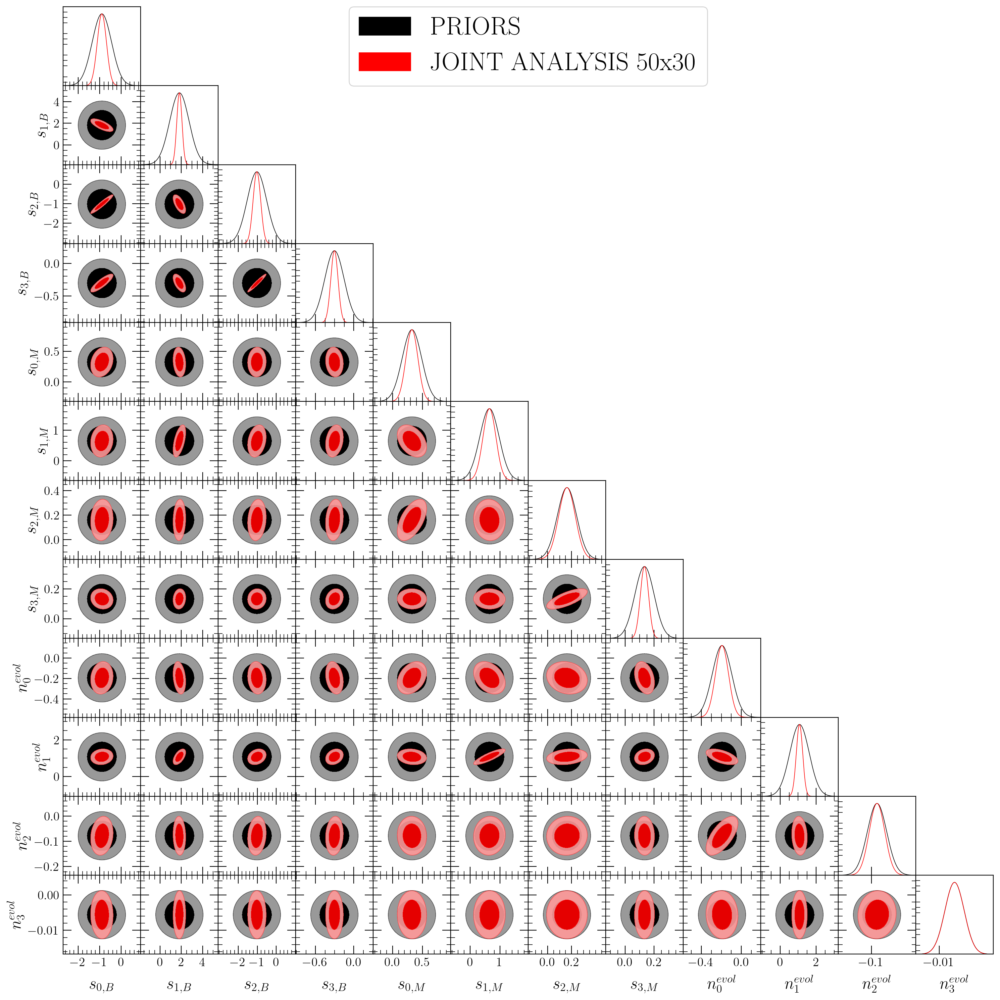

In [41]:
# Triangle plot

mean = params_fid[:-13]

sB_names = ['s'+str(int(i))+'B' for i in np.arange(len(sB_4fit50))]
sM_names = ['s'+str(int(i))+'M' for i in np.arange(len(sM_4fit))]

sB_labels=[r's_{'+str(i)+r',B}' for i in np.arange(len(sB_4fit30))]
sM_labels=[r's_{'+str(i)+r',M}' for i in np.arange(len(sM_4fit))]

num_names = ['n'+str(int(i)) for i in np.arange(len(num_fit))]

num_labels=[r'n_{'+str(i)+r'}^{evol}' for i in np.arange(len(num_fit))]

param_names = sB_names + sM_names + num_names 
labels = sB_labels + sM_labels + num_labels 

GaussDist_sbias_nevol_fit = GaussianND(mean, Sigma_Matrix_Joint50x30[:-13,:-13], labels = labels, names = param_names)
GaussDist_priors_sbias_nevol_fit = GaussianND(mean, Cov_prior_all, labels = labels, names = param_names)

g = plots.get_subplot_plotter(width_inch=15)
g.settings.legend_frame = True
g.settings.alpha_filled_add=0.9
g.settings.legend_fontsize=32
g.settings.axes_fontsize=18
g.settings.axes_labelsize=22
g.settings.axis_tick_max_labels=6

g.triangle_plot([GaussDist_priors_sbias_nevol_fit, GaussDist_sbias_nevol_fit], param_names, 
                filled=True, 
                legend_labels=['PRIORS', 'JOINT ANALYSIS 50x30'],
                contour_colors=['black', 'red'])

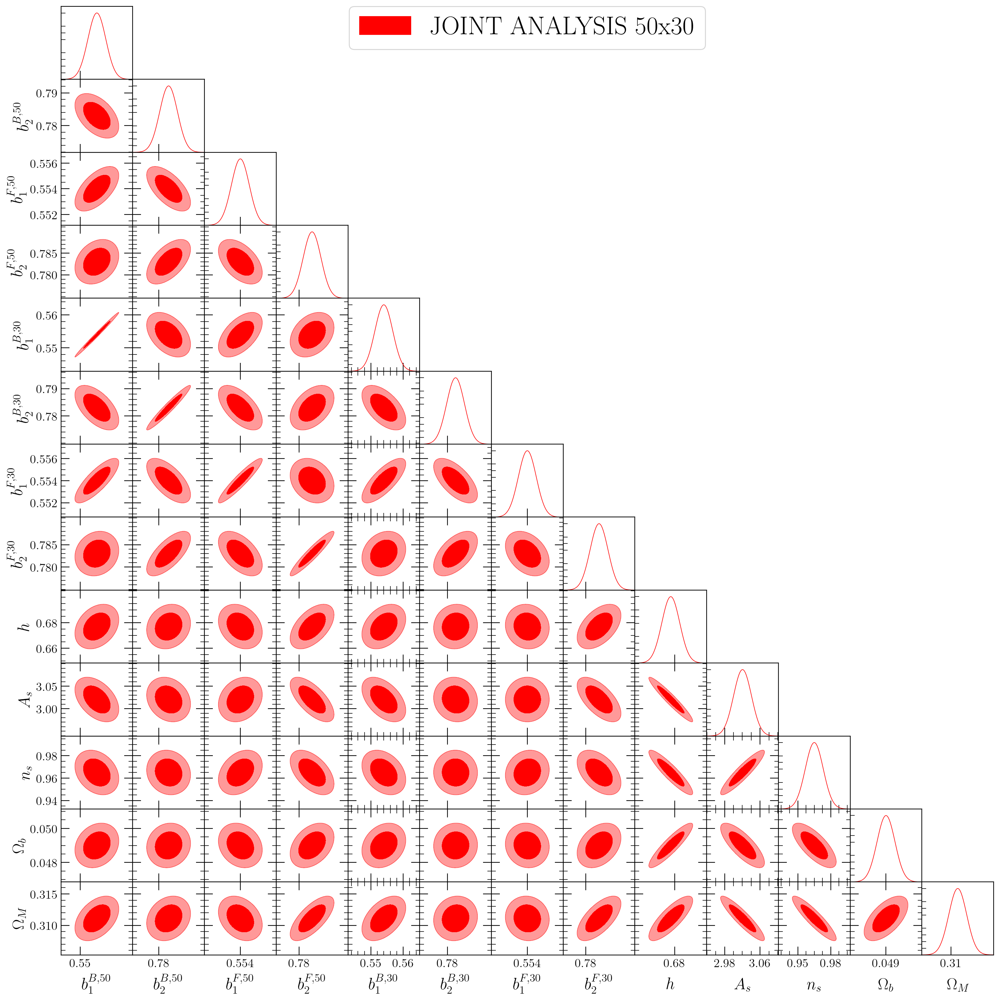

In [42]:
# Triangle plot: GALAXY BIAS AND COSMIC PARAMETERS

mean = params_fid[16:]

gbias_names = ['b1B_m1', 'b2B_m1', 'b1F_m1', 'b2F_m1'] + ['b1B_m2', 'b2B_m2', 'b1F_m2', 'b2F_m2']
cosmic_names = ['h', 'As', 'ns', 'Ob', 'OM']

gbias_labels = [r'b_1^{B,50}', r'b_2^{B,50}', r'b_1^{F,50}', r'b_2^{F,50}'] + [r'b_1^{B,30}', r'b_2^{B,30}', r'b_1^{F,30}', r'b_2^{F,30}']
cosmic_labels = [r'h', r'A_s', r'n_s', r'\Omega_b', r'\Omega_M']

param_names = gbias_names + cosmic_names
labels = gbias_labels + cosmic_labels

GaussDist_gbias_cosmic_fit = GaussianND(mean, Sigma_Matrix_Joint50x30[16:,16:], labels = labels, names = param_names)

g = plots.get_subplot_plotter(width_inch=15)
g.settings.legend_frame = True
g.settings.alpha_filled_add=0.9
g.settings.legend_fontsize=32
g.settings.axes_fontsize=18
g.settings.axes_labelsize=22
g.settings.axis_tick_max_labels=6

g.triangle_plot(GaussDist_gbias_cosmic_fit, param_names, 
                filled=True, 
                legend_labels=['JOINT ANALYSIS 50x30'],
                contour_colors=['red'])

In [43]:
print('\n'.join(['\t'.join([str(cell) for cell in row]) for row in Fisher_Matrix_Joint50x30[24:,24:]]))

9182006.204307172	2976049.211948083	992490.4113932454	-34543302.11891342	11812299.830871304
2976049.211948044	1025353.2324248665	221384.91071020073	-10731655.552210193	3777174.5479220287
992490.411393274	221384.91071019223	452383.27896581375	-3798775.1359797716	2361044.127039284
-34543302.11891404	-10731655.552210534	-3798775.135979568	141802002.46669024	-42404711.67049617
11812299.8308712	3777174.5479219165	2361044.127039363	-42404711.67049541	22846947.209211633


In [44]:
print('\n'.join(['\t'.join([str(cell) for cell in row]) for row in Sigma_Matrix_Joint50x30[24:,24:]]))

5.0875426983272364e-05	-0.00013808364807244987	-5.2838968020405416e-05	3.4431870243901957e-06	8.289370458501823e-06
-0.00013808364807242442	0.00041077674242514264	0.00015178784952438144	-8.377872692880747e-06	-2.675919998074797e-05
-5.283896802039792e-05	0.0001517878495243901	6.647656537780147e-05	-3.1852965560319463e-06	-1.066660322797988e-05
3.4431870243907823e-06	-8.377872692883935e-06	-3.1852965560331e-06	2.86712500557358e-07	4.6611830732541253e-07
8.289370458498059e-06	-2.6759199980741564e-05	-1.0666603227977134e-05	4.661183073250802e-07	2.1037371035367062e-06


In [45]:
print('\n'.join(['\t'.join([str(cell) for cell in row]) for row in Sigma_Matrix_Joint50x30[16:24,16:24]]))

4.738385722875279e-06	-2.866659609941697e-06	9.161380224232852e-07	1.2295858882777109e-06	6.003240023930546e-06	-4.165841012561411e-06	1.4522153095773e-06	6.379262851815496e-07
-2.866659609943634e-06	7.730507157938164e-06	-1.2186868687208027e-06	3.2784384422956756e-06	-3.3464444716809483e-06	8.971233087168354e-06	-1.4579894832139452e-06	3.926053962387914e-06
9.161380224231616e-07	-1.2186868687197536e-06	5.032028902441068e-07	-7.269223542144026e-07	1.0663713578469326e-06	-1.4171337617417399e-06	5.471203113485011e-07	-7.574441502153059e-07
1.229585888276937e-06	3.2784384422956083e-06	-7.26922354214821e-07	4.374337568103161e-06	1.8577116361022476e-06	3.0533116410608143e-06	-4.110177574318748e-07	4.021486469913756e-06
6.003240023930666e-06	-3.3464444716786613e-06	1.0663713578470736e-06	1.8577116361032767e-06	7.706899510376842e-06	-5.171192162119688e-06	1.7336175105977958e-06	1.1645015376856742e-06
-4.165841012563969e-06	8.971233087168333e-06	-1.417133761742954e-06	3.0533116410606004e-06	-5

In [46]:
np.allclose(Sigma_Matrix_Joint50x30[16:24,16:24], Sigma_Matrix_Joint50x30[16:24,16:24].T, rtol=1e-2)

True

# SINGLE SPLIT 

### $m = 2 \,\rightarrow\,$ $50\%$ Brigth - $50\%$ Faint

In [47]:
len(dsignal_dgbias50[1,1])/2

324.0

In [48]:
dsignal_dtheta_fit_all50 = np.concatenate([dsignal_dsbias50, dsignal_dnum50, dsignal_dgbias50[:,:,:324], dsignal_dcosmic50])

np.shape(dsignal_dtheta_fit_all50)

(21, 19, 324)

In [49]:
# Create the Cov Matrix for sB, sF, num

Cov_priors_50 = np.diag(np.concatenate([dsB_50**2, dsM**2, dnum**2]))

Inv_Cov_prior_50_ = np.linalg.inv(Cov_priors_50)

Inv_Cov_prior_50 = np.zeros([len(dsignal_dtheta_fit_all50), len(dsignal_dtheta_fit_all50)])
Inv_Cov_prior_50[:len(Inv_Cov_prior_50_), :len(Inv_Cov_prior_50_)] = Inv_Cov_prior_50_

np.shape(Cov_priors_50)

(12, 12)

In [50]:
# Fisher Matrix + prior

Inv_Cov_Multipoles_50 = fm.inverse_cov_matrix_survey(d = dist[0], z_bins = z_bins, split=[50, 50], small_off_diagonal = True, rtol=1e-10)

Fisher_Matrix_50_ = fm.fisher_matrix(d_signal = dsignal_dtheta_fit_all50, inv_cov = Inv_Cov_Multipoles_50, z_bins = z_bins)

Fisher_Matrix_50 = Fisher_Matrix_50_ + Inv_Cov_prior_50

np.shape(Fisher_Matrix_50)


 ... Loading Covariance Matrices [MONOBB, MONOBF, MONOFF, DIPBF, QUADBB, QUADBF, QUADFF, HEXAT, OCTBF] ... 

Population splitted in 50% BRIGHT - 50% FAINT 


 ... Computing the Inverse [MONOBB, MONOBF, MONOFF, DIPBF, QUADBB, QUADBF, QUADFF, HEXAT, OCTBF] ... 

---------------------------------------- DONE. ---------------------------------------- 


 ... Computing the Fisher Matrix ... 

Signal & Cov must be given as functions (z,d) and (z,d,d') respectively. 


 ... Success! ... 



(21, 21)

In [51]:
print(np.allclose(Fisher_Matrix_50, Fisher_Matrix_50.T, rtol=1e-11))

True


In [52]:
np.linalg.det(Fisher_Matrix_50)

2.179988106139095e+78

In [53]:
Sigma_Matrix_50 = np.linalg.inv(Fisher_Matrix_50)

#Absolute Errors

Abs_Errors_all_50 = np.sqrt(np.diag(Sigma_Matrix_50))

# Fiducial values

sbias_fit_50 = np.concatenate([sB_4fit50, sM_4fit])
gbias_fit_50 = np.concatenate([np.array([0.554, 0.783]), np.array([0.554, 0.783])])
cosmic_fid = np.fromiter(params_dict0.values(), dtype=float)
cosmic_fid[1] = np.log(10**10 * cosmic_fid[1])

params_fid_50 = np.concatenate([sbias_fit_50, num_fit, gbias_fit_50, cosmic_fid])

# Relative errors

Rel_Errors_all_50 = np.abs(Abs_Errors_all_50/params_fid_50)

par_errors_all_50 = Rel_Errors_all_50 * 100

print()
print('------------ Relative errors * 100 ------------' )
print()
print('sB = ', par_errors_all_50[0:int(len(sbias_fit_50)/2)])
print()
print('smodel = ', par_errors_all_50[int(len(sbias_fit_50)/2):len(sbias_fit_50)])
print()
print('number = ', par_errors_all_50[len(sbias_fit_50):(len(sbias_fit_50) + len(num_fit))])
print()
print('gbias = ', par_errors_all_50[(len(sbias_fit_50) + len(num_fit)):(len(sbias_fit_50) + len(num_fit) + len(gbias_fit_50))])
print()
print('cosmic = ', par_errors_all_50[(len(sbias_fit_50) + len(num_fit)+len(gbias_fit_50)):])


------------ Relative errors * 100 ------------

sB =  [30.01764633 18.47280797 25.02675148 23.80647391]

smodel =  [39.28697349 27.82862142 45.07011976 49.94474664]

number =  [41.31183921 31.04109674 25.55481329 30.7077926 ]

gbias =  [0.42748007 0.36834475 0.14148394 0.27887022]

cosmic =  [1.10447113 0.7080217  0.9005235  1.12958113 0.49626418]


In [54]:
print(np.allclose(Sigma_Matrix_50, Sigma_Matrix_50.T, rtol=1e-20))

True


In [55]:
np.linalg.det(Sigma_Matrix_50)

4.5871809904976945e-79

In [56]:
# Perform Singular Value Decomposition

U, s, Vh = np.linalg.svd(Fisher_Matrix_50)

# s contains the singular values of A
print("Singular values of A:", s)

# Calculate the condition number
condition_number = s[0] / s[-1]
print("Condition number of A:", condition_number)

Singular values of A: [1.49738423e+08 3.47064259e+07 7.26717270e+06 2.14322560e+06
 9.40896340e+05 3.25376173e+05 1.95184273e+05 1.48536833e+05
 8.78969553e+04 8.51226555e+04 7.12651338e+04 2.12686527e+04
 1.72353028e+03 9.39405528e+02 1.84293532e+02 1.66456915e+01
 9.97768534e+00 6.15306960e+00 4.24282110e-01 6.33036148e-02
 3.26697788e-02]
Condition number of A: 4583392624.347591


In [57]:
# Create Σ+ (the pseudo-inverse of the diagonal matrix Σ)
S_plus = np.zeros((Fisher_Matrix_50.shape[0], Fisher_Matrix_50.shape[1])).T
S_plus[:s.shape[0], :s.shape[0]] = np.linalg.inv(np.diag(s))

# Compute the pseudo-inverse of A
A_plus = Vh.T @ S_plus @ U.T

# Verify by multiplying with the original matrix A
identity_matrix = Fisher_Matrix_50 @ A_plus

In [58]:
np.allclose(A_plus, Sigma_Matrix_50, rtol=1e-20)

True

# SINGLE SPLIT 

### $m = 10/3 \,\rightarrow\,$ $30\%$ Brigth - $70\%$ Faint

In [59]:
len(dsignal_dgbias30[1,1])/2

324.0

In [60]:
dsignal_dtheta_fit_all30 = np.concatenate([dsignal_dsbias30, dsignal_dnum30, dsignal_dgbias30[:,:,324:], dsignal_dcosmic30])

np.shape(dsignal_dtheta_fit_all30)

(21, 19, 324)

In [61]:
# Create the Cov Matrix for sB, sF, num

Cov_priors_30 = np.diag(np.concatenate([dsB_30**2, dsM**2, dnum**2]))

Inv_Cov_prior_30_ = np.linalg.inv(Cov_priors_30)

Inv_Cov_prior_30 = np.zeros([len(dsignal_dtheta_fit_all30), len(dsignal_dtheta_fit_all30)])
Inv_Cov_prior_30[:len(Inv_Cov_prior_30_), :len(Inv_Cov_prior_30_)] = Inv_Cov_prior_30_

np.shape(Cov_priors_30)

(12, 12)

In [62]:
# Fisher Matrix + prior

Inv_Cov_Multipoles_30 = fm.inverse_cov_matrix_survey(d = dist[0], z_bins = z_bins, split=[30, 70], small_off_diagonal = True, rtol=1e-10)

Fisher_Matrix_30_ = fm.fisher_matrix(d_signal = dsignal_dtheta_fit_all30, inv_cov = Inv_Cov_Multipoles_30, z_bins = z_bins)

Fisher_Matrix_30 = Fisher_Matrix_30_ + Inv_Cov_prior_30

np.shape(Fisher_Matrix_30)


 ... Loading Covariance Matrices [MONOBB, MONOBF, MONOFF, DIPBF, QUADBB, QUADBF, QUADFF, HEXAT, OCTBF] ... 

Population splitted in 30% BRIGHT - 70% FAINT 


 ... Computing the Inverse [MONOBB, MONOBF, MONOFF, DIPBF, QUADBB, QUADBF, QUADFF, HEXAT, OCTBF] ... 

---------------------------------------- DONE. ---------------------------------------- 


 ... Computing the Fisher Matrix ... 

Signal & Cov must be given as functions (z,d) and (z,d,d') respectively. 


 ... Success! ... 



(21, 21)

In [63]:
np.allclose(Fisher_Matrix_30, Fisher_Matrix_30.T, rtol=1e-9)

True

In [64]:
np.linalg.det(Fisher_Matrix_30)

2.6810256273585904e+78

In [65]:
Sigma_Matrix_30 = np.linalg.inv(Fisher_Matrix_30)

#Absolute Errors

Abs_Errors_all_30 = np.sqrt(np.diag(Sigma_Matrix_30))

# Fiducial values

sbias_fit_30 = np.concatenate([sB_4fit30, sM_4fit])
gbias_fit_30 = np.concatenate([np.array([0.554, 0.783]), np.array([0.554, 0.783])])
cosmic_fid = np.fromiter(params_dict0.values(), dtype=float)
cosmic_fid[1] = np.log(10**10 * cosmic_fid[1])

params_fid_30 = np.concatenate([sbias_fit_30, num_fit, gbias_fit_30, cosmic_fid])

# Relative errors

Rel_Errors_all_30 = np.abs(Abs_Errors_all_30/params_fid_30)

par_errors_all_30 = Rel_Errors_all_30 * 100

print()
print('------------ Relative errors * 100 ------------' )
print()
print('sB = ', par_errors_all_30[0:int(len(sbias_fit_30)/2)])
print()
print('smodel = ', par_errors_all_30[int(len(sbias_fit_30)/2):len(sbias_fit_30)])
print()
print('number = ', par_errors_all_30[len(sbias_fit_30):(len(sbias_fit_30) + len(num_fit))])
print()
print('gbias = ', par_errors_all_30[(len(sbias_fit_30) + len(num_fit)):(len(sbias_fit_30) + len(num_fit) + len(gbias_fit_30))])
print()
print('cosmic = ', par_errors_all_30[(len(sbias_fit_30) + len(num_fit)+len(gbias_fit_30)):])


------------ Relative errors * 100 ------------

sB =  [32.77098776 35.99519111 43.48387163 21.43123245]

smodel =  [37.70664864 18.49161365 46.45925058 49.95847275]

number =  [40.50135422 28.00600107 24.09305441 29.60954112]

gbias =  [0.5197008  0.43532272 0.15657671 0.26554043]

cosmic =  [1.0767337  0.68903007 0.87149893 1.1102924  0.47934639]


In [66]:
np.allclose(Sigma_Matrix_30, Sigma_Matrix_30.T, rtol=1e-20)

True

In [67]:
np.linalg.det(Sigma_Matrix_30)

3.7299158568108776e-79

In [68]:
# Perform Singular Value Decomposition

U, s, Vh = np.linalg.svd(Sigma_Matrix_30)

# s contains the singular values of A
print("Singular values of A:", s)

# Calculate the condition number
condition_number = s[0] / s[-1]
print("(Log)-Condition number of A:", np.log10(condition_number))

Singular values of A: [2.98596806e+01 1.23203727e+01 1.80788998e+00 7.59305434e-02
 5.66488582e-02 1.34313720e-02 4.61196755e-03 1.82030412e-03
 5.49187844e-04 9.53139017e-05 2.12249775e-05 1.70676764e-05
 1.65168474e-05 1.16507383e-05 5.08073800e-06 4.50653497e-06
 1.02450963e-06 5.70457086e-07 1.26781485e-07 3.05908392e-08
 6.10554720e-09]
(Log)-Condition number of A: 9.6893605644134


In [69]:
# Create Σ+ (the pseudo-inverse of the diagonal matrix Σ)
S_plus = np.zeros((Sigma_Matrix_30.shape[0], Sigma_Matrix_30.shape[1])).T
S_plus[:s.shape[0], :s.shape[0]] = np.linalg.inv(np.diag(s))

# Compute the pseudo-inverse of A
A_plus = Vh.T @ S_plus @ U.T

# Verify by multiplying with the original matrix A
identity_matrix = Sigma_Matrix_30 @ A_plus

In [70]:
determinant = np.prod(s)

print(f'The determinant of the Sigma Matrix is: {determinant}')

The determinant of the Sigma Matrix is: 3.7299158567679296e-79


In [71]:
np.allclose(A_plus, Fisher_Matrix_30, rtol=1e-7)

True

Comparison with result of combined analysis

In [72]:
print()
print('------------ Relative errors * 100 ------------' )
print()
print('sB_50 = ', par_errors_all_Joint[0:int(len(sB_fit)/2)])
print()
print('sB_30 = ', par_errors_all_Joint[int(len(sB_fit)/2):len(sB_fit)])
print()
print('s_model = ', par_errors_all_Joint[len(sB_fit):len(sB_fit)+len(sM_4fit)])
print()
print('number = ', par_errors_all_Joint[(len(sB_fit)+len(sM_4fit)):(len(sB_fit)+len(sM_4fit)+len(num_fit))])
print()
print('gbias_50 = ', par_errors_all_Joint[((len(sB_fit)+len(sM_4fit)+len(num_fit))):((len(sB_fit)+len(sM_4fit)+len(num_fit))+int(len(gbias_fit)/2))])
print()
print('gbias_30 = ', par_errors_all_Joint[(len(sB_fit)+len(sM_4fit)+len(num_fit)+int(len(gbias_fit)/2)):((len(sB_fit)+len(sM_4fit)+len(num_fit))+int(len(gbias_fit)))])
print()
print('cosmic = ', par_errors_all_Joint[((len(sB_fit)+len(sM_4fit)+len(num_fit))+len(gbias_fit)):((len(sB_fit)+len(sM_4fit)+len(num_fit))+len(gbias_fit) + len(cosmic_fid))])
print()


------------ Relative errors * 100 ------------

sB_50 =  [23.72477949 13.35077385 19.52938287 18.75378014]

sB_30 =  [30.89036048 33.35639265 42.9050774  21.17699369]

s_model =  [33.60940859 16.42138878 40.30174135 49.81715337]

number =  [39.95208718 26.65573839 19.57390245 27.31992325]

gbias_50 =  [0.39292118 0.3550931  0.12804476 0.26711261]

gbias_30 =  [0.50110655 0.42766668 0.14902116 0.26080041]

cosmic =  [1.05357478 0.6710191  0.84490324 1.09276615 0.46622518]



# Numerical comparison

In [73]:
cosmic50x50 = par_errors_all_50[(len(sbias_fit_50) + len(num_fit)+len(gbias_fit_50)):]
cosmic30x70 = par_errors_all_30[(len(sbias_fit_30) + len(num_fit) + len(gbias_fit_30)):]

cosmicjoint = par_errors_all_Joint[((len(sB_fit)+len(sM_4fit)+len(num_fit))+len(gbias_fit)):((len(sB_fit)+len(sM_4fit)+len(num_fit))+len(gbias_fit) + len(cosmic_fid))]

In [74]:
sm50x50 = par_errors_all_50[int(len(sbias_fit_50)/2):len(sbias_fit_50)]
sm30x70 = par_errors_all_30[int(len(sbias_fit_30)/2):len(sbias_fit_30)]

sB50x50 = par_errors_all_50[0:int(len(sbias_fit_50)/2)]
sB30x70 = par_errors_all_30[0:int(len(sbias_fit_30)/2)]

sB50joint = par_errors_all_Joint[0:int(len(sB_fit)/2)]
sB30joint = par_errors_all_Joint[int(len(sB_fit)/2):len(sB_fit)]

smjoint = par_errors_all_Joint[len(sB_fit):len(sB_fit)+len(sM_4fit)]

In [75]:
np.shape(par_errors_all_Joint)

(29,)

In [76]:
gbias50x50 = par_errors_all_50[(len(sbias_fit_50) + len(num_fit)):(len(sbias_fit_50) + len(num_fit) + len(gbias_fit_50))]
gbias30x70 = par_errors_all_30[(len(sbias_fit_30) + len(num_fit)):(len(sbias_fit_30) + len(num_fit) + len(gbias_fit_30))]

gbias50joint = par_errors_all_Joint[((len(sB_fit)+len(sM_4fit)+len(num_fit))):((len(sB_fit)+len(sM_4fit)+len(num_fit))+int(len(gbias_fit)/2))]
gbias30joint = par_errors_all_Joint[(len(sB_fit)+len(sM_4fit)+len(num_fit)+int(len(gbias_fit)/2)):((len(sB_fit)+len(sM_4fit)+len(num_fit))+int(len(gbias_fit)))]

In [77]:
num50x50 = par_errors_all_50[len(sbias_fit_50):(len(sbias_fit_50) + len(num_fit))]
num30x70 = par_errors_all_30[len(sbias_fit_30):(len(sbias_fit_30) + len(num_fit))]

numjoint = par_errors_all_Joint[(len(sB_fit)+len(sM_4fit)):(len(sB_fit)+len(sM_4fit)+len(num_fit))]

In [78]:
print('\n Difference Joint vs 50x50 \n')
print(' DsB = ', (1-sB50joint/sB50x50) * 100, '\n')
print(' Dgbias = ',  (1-gbias50joint/gbias50x50) * 100, '\n')
print(' Dsmodel = ', (1-smjoint/sm50x50) * 100, '\n')
print(' Dnum = ', (1-numjoint/num50x50) * 100, '\n')
print(' Dcosmic = ', (1-cosmicjoint/cosmic50x50) * 100, '\n')

print('\n Difference Joint vs 30x70 \n')
print(' DsB = ', (1-sB30joint/sB30x70) * 100, '\n')
print(' Dgbias = ',  (1-gbias30joint/gbias30x70) * 100, '\n')
print(' Dsmodel = ', (1-smjoint/sm30x70) * 100, '\n')
print(' Dnum = ', (1-numjoint/num30x70) * 100, '\n')
print(' Dcosmic = ', (1-cosmicjoint/cosmic30x70) * 100, '\n')


 Difference Joint vs 50x50 

 DsB =  [20.96389163 27.72742579 21.96596956 21.22403254] 

 Dgbias =  [8.08432699 3.59762293 9.49873252 4.21615787] 

 Dsmodel =  [14.45152016 40.99100874 10.57991066  0.25546884] 

 Dnum =  [ 3.29143426 14.12758832 23.40424392 11.03260463] 

 Dcosmic =  [4.60821023 5.22619569 6.17643686 3.25917122 6.05302666] 


 Difference Joint vs 30x70 

 DsB =  [5.73869576 7.33097501 1.33105497 1.18630023] 

 Dgbias =  [3.57787525 1.75870398 4.82546509 1.7850481 ] 

 Dsmodel =  [10.86609443 11.19547975 13.25356985  0.2828737 ] 

 Dnum =  [ 1.35616957  4.8213334  18.75707366  7.73270297] 

 Dcosmic =  [2.15084982 2.61396021 3.05171815 1.57852538 2.73731347] 



In [79]:
print('\n Difference 50x50 vs 30x70 \n')
print(' DsB = ', (1-sB50x50/sB30x70) * 100, '\n')
print(' Dgbias = ',  (1-gbias50x50/gbias30x70) * 100, '\n')
print(' Dsmodel = ', (1-sm50x50/sm30x70) * 100, '\n')
print(' Dnum = ', (1-num50x50/num30x70) * 100, '\n')
print(' Dcosmic = ', (1-cosmic50x50/cosmic30x70) * 100, '\n')


 Difference 50x50 vs 30x70 

 DsB =  [  8.40176514  48.67978916  42.44589881 -11.08308385] 

 Dgbias =  [17.74496656 15.38581832  9.63921926 -5.019869  ] 

 Dsmodel =  [-4.19110396e+00 -5.04932017e+01  2.98999835e+00  2.74750516e-02] 

 Dnum =  [ -2.00113059 -10.83730471  -6.06713806  -3.70911349] 

 Dcosmic =  [-2.57607118 -2.75628429 -3.33042    -1.73726632 -3.52934541] 



In [80]:
type(sB50joint)

numpy.ndarray

In [81]:
pars50x50 = np.concatenate([sB50x50,sm50x50,num50x50])
parsJoint50 = np.concatenate([sB50joint,smjoint,numjoint])
delta50 = np.concatenate([(1-sB50joint/sB50x50) * 100, (1-smjoint/sm50x50) * 100, (1-numjoint/num50x50) * 100])

pars30x70 = np.concatenate([sB30x70,sm30x70,num30x70])
parsJoint30 = np.concatenate([sB30joint,smjoint,numjoint])
delta30 = np.concatenate([(1-sB30joint/sB30x70) * 100, (1-smjoint/sm30x70) * 100, (1-numjoint/num30x70) * 100])

In [82]:
import pandas as pd

row_names = {
    0: "sB_0",
    1: "sB_1",
    2: "sB_2",
    3: "sB_3",
    4: "sM_0",
    5: "sM_2",
    6: "sM_3",
    7: "sM_4",
    8: "n_0",
    9: "n_1",
    10: "n_2",
    11: "n_3",
}

constraints_joint_vs_one= {
    "50x50" : pars50x50,
    "Joint_50" : parsJoint50,
    "Delta vs 50" : delta50,
    "30x70" : pars30x70,
    "Joint_30" : parsJoint30,
    "Delta vs 30" : delta30
}

df_constraints_joint_vs_one= pd.DataFrame(constraints_joint_vs_one, index=row_names.values())
df_constraints_joint_vs_one = df_constraints_joint_vs_one.apply(pd.Series.round, args=[2])

In [83]:
df_constraints_joint_vs_one

,50x50,Joint_50,Delta vs 50,30x70,Joint_30,Delta vs 30
sB_0,30.02,23.72,20.96,32.77,30.89,5.74
sB_1,18.47,13.35,27.73,36.00,33.36,7.33
sB_2,25.03,19.53,21.97,43.48,42.91,1.33
sB_3,23.81,18.75,21.22,21.43,21.18,1.19
sM_0,39.29,33.61,14.45,37.71,33.61,10.87
sM_2,27.83,16.42,40.99,18.49,16.42,11.20
sM_3,45.07,40.30,10.58,46.46,40.30,13.25
sM_4,49.94,49.82,0.26,49.96,49.82,0.28
n_0,41.31,39.95,3.29,40.50,39.95,1.36
n_1,31.04,26.66,14.13,28.01,26.66,4.82


In [84]:
latex_string = df_constraints_joint_vs_one.to_latex(index=True, float_format='%.2f')  # Remove index if desired
print(latex_string)

\begin{tabular}{lrrrrrr}
\toprule
 & 50x50 & Joint_50 & Delta vs 50 & 30x70 & Joint_30 & Delta vs 30 \\
\midrule
sB_0 & 30.02 & 23.72 & 20.96 & 32.77 & 30.89 & 5.74 \\
sB_1 & 18.47 & 13.35 & 27.73 & 36.00 & 33.36 & 7.33 \\
sB_2 & 25.03 & 19.53 & 21.97 & 43.48 & 42.91 & 1.33 \\
sB_3 & 23.81 & 18.75 & 21.22 & 21.43 & 21.18 & 1.19 \\
sM_0 & 39.29 & 33.61 & 14.45 & 37.71 & 33.61 & 10.87 \\
sM_2 & 27.83 & 16.42 & 40.99 & 18.49 & 16.42 & 11.20 \\
sM_3 & 45.07 & 40.30 & 10.58 & 46.46 & 40.30 & 13.25 \\
sM_4 & 49.94 & 49.82 & 0.26 & 49.96 & 49.82 & 0.28 \\
n_0 & 41.31 & 39.95 & 3.29 & 40.50 & 39.95 & 1.36 \\
n_1 & 31.04 & 26.66 & 14.13 & 28.01 & 26.66 & 4.82 \\
n_2 & 25.55 & 19.57 & 23.40 & 24.09 & 19.57 & 18.76 \\
n_3 & 30.71 & 27.32 & 11.03 & 29.61 & 27.32 & 7.73 \\
\bottomrule
\end{tabular}



In [85]:
row_names = {
    0: "sB_0",
    1: "sB_1",
    2: "sB_2",
    3: "sB_3",
}

constraints_s_joint_vs_one= {
    "50x50" : pars50x50[:4],
    "Joint_50" : parsJoint50[:4],
    "Delta vs 50" : delta50[:4],
    "30x70" : pars30x70[:4],
    "Joint_30" : parsJoint30[:4],
    "Delta vs 30" : delta30[:4]
}

df_constraints_s_joint_vs_one= pd.DataFrame(constraints_s_joint_vs_one, index=row_names.values())
df_constraints_s_joint_vs_one = df_constraints_s_joint_vs_one.apply(pd.Series.round, args=[2])

In [86]:
df_constraints_s_joint_vs_one

,50x50,Joint_50,Delta vs 50,30x70,Joint_30,Delta vs 30
sB_0,30.02,23.72,20.96,32.77,30.89,5.74
sB_1,18.47,13.35,27.73,36.00,33.36,7.33
sB_2,25.03,19.53,21.97,43.48,42.91,1.33
sB_3,23.81,18.75,21.22,21.43,21.18,1.19


In [87]:
latex_string = df_constraints_s_joint_vs_one.to_latex(index=True, float_format='%.2f')  # Remove index if desired
print(latex_string)

\begin{tabular}{lrrrrrr}
\toprule
 & 50x50 & Joint_50 & Delta vs 50 & 30x70 & Joint_30 & Delta vs 30 \\
\midrule
sB_0 & 30.02 & 23.72 & 20.96 & 32.77 & 30.89 & 5.74 \\
sB_1 & 18.47 & 13.35 & 27.73 & 36.00 & 33.36 & 7.33 \\
sB_2 & 25.03 & 19.53 & 21.97 & 43.48 & 42.91 & 1.33 \\
sB_3 & 23.81 & 18.75 & 21.22 & 21.43 & 21.18 & 1.19 \\
\bottomrule
\end{tabular}



In [88]:
import pandas as pd

row_names = {
    0: "sM_0",
    1: "sM_2",
    2: "sM_3",
    3: "sM_4",
    4: "n_0",
    5: "n_1",
    6: "n_2",
    7: "n_3",
}

constraints_fixed_joint_vs_one= {
    "50x50" : pars50x50[4:],
    "30x70" : pars30x70[4:],    
    "Joint" : parsJoint30[4:],
    "Delta vs 50" : delta50[4:],
    "Delta vs 30" : delta30[4:]
}

df_constraints_fixed_joint_vs_one= pd.DataFrame(constraints_fixed_joint_vs_one, index=row_names.values())
df_constraints_fixed_joint_vs_one = df_constraints_fixed_joint_vs_one.apply(pd.Series.round, args=[2])

In [89]:
df_constraints_fixed_joint_vs_one

,50x50,30x70,Joint,Delta vs 50,Delta vs 30
sM_0,39.29,37.71,33.61,14.45,10.87
sM_2,27.83,18.49,16.42,40.99,11.20
sM_3,45.07,46.46,40.30,10.58,13.25
sM_4,49.94,49.96,49.82,0.26,0.28
n_0,41.31,40.50,39.95,3.29,1.36
n_1,31.04,28.01,26.66,14.13,4.82
n_2,25.55,24.09,19.57,23.40,18.76
n_3,30.71,29.61,27.32,11.03,7.73


In [90]:
latex_string = df_constraints_fixed_joint_vs_one.to_latex(index=True, float_format='%.2f')  # Remove index if desired
print(latex_string)

\begin{tabular}{lrrrrr}
\toprule
 & 50x50 & 30x70 & Joint & Delta vs 50 & Delta vs 30 \\
\midrule
sM_0 & 39.29 & 37.71 & 33.61 & 14.45 & 10.87 \\
sM_2 & 27.83 & 18.49 & 16.42 & 40.99 & 11.20 \\
sM_3 & 45.07 & 46.46 & 40.30 & 10.58 & 13.25 \\
sM_4 & 49.94 & 49.96 & 49.82 & 0.26 & 0.28 \\
n_0 & 41.31 & 40.50 & 39.95 & 3.29 & 1.36 \\
n_1 & 31.04 & 28.01 & 26.66 & 14.13 & 4.82 \\
n_2 & 25.55 & 24.09 & 19.57 & 23.40 & 18.76 \\
n_3 & 30.71 & 29.61 & 27.32 & 11.03 & 7.73 \\
\bottomrule
\end{tabular}



# Triangle Plots

In [91]:
np.shape(params_fid), np.shape(params_fid_50)

((29,), (21,))

In [92]:
# Delete rows and columns alien to the 50x50 split

nind = list(range(4,8))

Sigma_Matrix_Joint50x30_ = Sigma_Matrix_Joint50x30

Sigma_Matrix_Joint50x30_ = np.delete(arr=Sigma_Matrix_Joint50x30_, obj=nind, axis=0)
Sigma_Matrix_Joint50x30_ = np.delete(arr=Sigma_Matrix_Joint50x30_, obj=nind, axis=1)

np.shape(Sigma_Matrix_Joint50x30_)

(25, 25)

In [93]:
# Delete elements of params_fid

params_fid_ = params_fid[:-13]

params_fid_ = np.delete(arr=params_fid_, obj=nind, axis=0)

np.shape(params_fid_)

(12,)

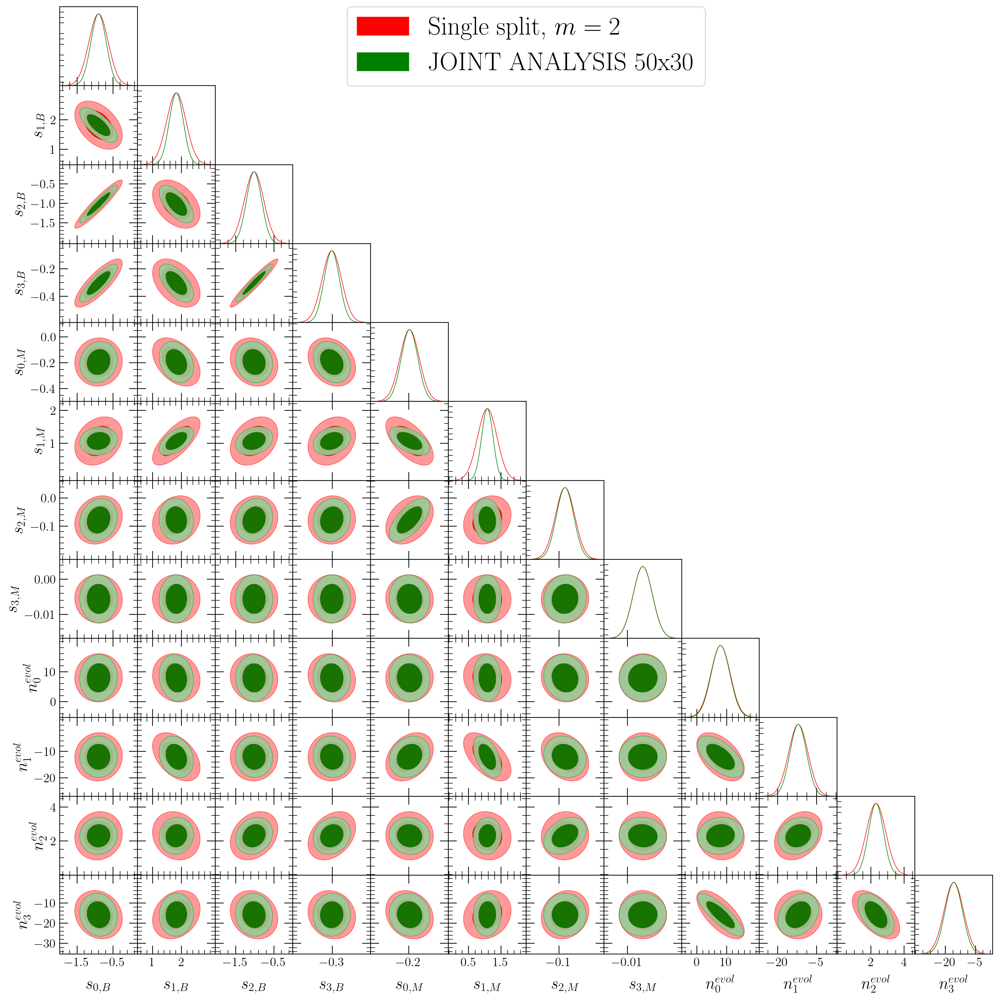

In [94]:
# Triangle plot

mean_joint = params_fid_
mean_50 = params_fid_50[:-9]

sB_names = ['s'+str(int(i))+'B' for i in np.arange(len(sB_4fit50))]
sM_names = ['s'+str(int(i))+'M' for i in np.arange(len(sM_4fit))]

sB_labels=[r's_{'+str(i)+r',B}' for i in np.arange(len(sB_4fit50))]
sM_labels=[r's_{'+str(i)+r',M}' for i in np.arange(len(sM_4fit))]

num_names = ['n'+str(int(i)) for i in np.arange(len(num_fit))]

num_labels=[r'n_{'+str(i)+r'}^{evol}' for i in np.arange(len(num_fit))]

param_names = sB_names + sM_names + num_names 
labels = sB_labels + sM_labels + num_labels 

GaussDist_joint_sbias_nevol_fit_ = GaussianND(mean_joint, Sigma_Matrix_Joint50x30_[:-13,:-13], labels = labels, names = param_names)
GaussDist_50_sbias_nevol_fit = GaussianND(mean_50, Sigma_Matrix_50[:-9,:-9], labels = labels, names = param_names)

g = plots.get_subplot_plotter(width_inch=15)
g.settings.legend_frame = True
g.settings.alpha_filled_add=0.9
g.settings.legend_fontsize=32
g.settings.axes_fontsize=18
g.settings.axes_labelsize=22
g.settings.axis_tick_max_labels=6

g.triangle_plot([GaussDist_50_sbias_nevol_fit, GaussDist_joint_sbias_nevol_fit_], param_names, 
                filled=True, 
                legend_labels=[r'Single split, $m=2$', r'JOINT ANALYSIS 50x30'],
                contour_colors=['red', 'green'])

In [95]:
np.shape(params_fid), np.shape(params_fid_30)

((29,), (21,))

In [96]:
# Delete rows and columns alien to the 30x70 split

nind = list(range(0,4))

Sigma_Matrix_Joint50x30_ = Sigma_Matrix_Joint50x30

Sigma_Matrix_Joint50x30_ = np.delete(arr=Sigma_Matrix_Joint50x30_, obj=nind, axis=0)
Sigma_Matrix_Joint50x30_ = np.delete(arr=Sigma_Matrix_Joint50x30_, obj=nind, axis=1)

np.shape(Sigma_Matrix_Joint50x30_)

(25, 25)

In [97]:
# Delete elements of params_fid

params_fid_ = params_fid[:-13]

params_fid_ = np.delete(arr=params_fid_, obj=nind, axis=0)

np.shape(params_fid_)

(12,)

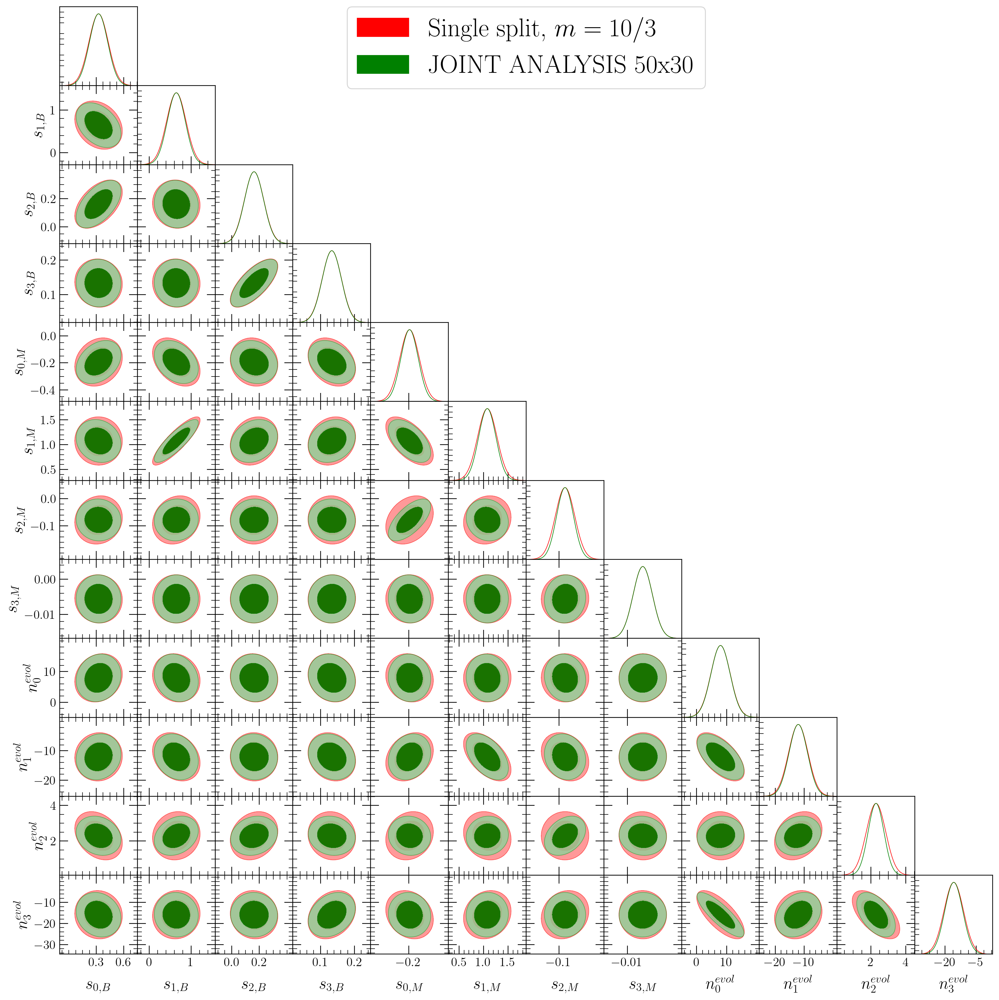

In [98]:
# Triangle plot

mean_joint = params_fid_
mean_30 = params_fid_30[:-9]

sB_names = ['s'+str(int(i))+'B' for i in np.arange(len(sB_4fit50))]
sM_names = ['s'+str(int(i))+'M' for i in np.arange(len(sM_4fit))]

sB_labels=[r's_{'+str(i)+r',B}' for i in np.arange(len(sB_4fit50))]
sM_labels=[r's_{'+str(i)+r',M}' for i in np.arange(len(sM_4fit))]

num_names = ['n'+str(int(i)) for i in np.arange(len(num_fit))]

num_labels=[r'n_{'+str(i)+r'}^{evol}' for i in np.arange(len(num_fit))]

param_names = sB_names + sM_names + num_names 
labels = sB_labels + sM_labels + num_labels 

GaussDist_joint_sbias_nevol_fit_ = GaussianND(mean_joint, Sigma_Matrix_Joint50x30_[:-13,:-13], labels = labels, names = param_names)
GaussDist_30_sbias_nevol_fit = GaussianND(mean_30, Sigma_Matrix_30[:-9,:-9], labels = labels, names = param_names)

g = plots.get_subplot_plotter(width_inch=15)
g.settings.legend_frame = True
g.settings.alpha_filled_add=0.9
g.settings.legend_fontsize=32
g.settings.axes_fontsize=18
g.settings.axes_labelsize=22
g.settings.axis_tick_max_labels=6

g.triangle_plot([GaussDist_30_sbias_nevol_fit, GaussDist_joint_sbias_nevol_fit_], param_names, 
                filled=True, 
                legend_labels=[r'Single split, $m=10/3$', r'JOINT ANALYSIS 50x30'],
                contour_colors=['red', 'green'])

In [99]:
# Delete rows and columns alien to the 50x50 split

nind = list(range(0,16)) + list(range(20,24))

Sigma_Matrix_Joint50x30_ = Sigma_Matrix_Joint50x30

Sigma_Matrix_Joint50x30_ = np.delete(arr=Sigma_Matrix_Joint50x30_, obj=nind, axis=0)
Sigma_Matrix_Joint50x30_ = np.delete(arr=Sigma_Matrix_Joint50x30_, obj=nind, axis=1)

np.shape(Sigma_Matrix_Joint50x30_)

(9, 9)

In [100]:
# Delete elements of params_fid

params_fid_ = params_fid

params_fid_ = np.delete(arr=params_fid_, obj=nind, axis=0)

np.shape(params_fid_)

(9,)

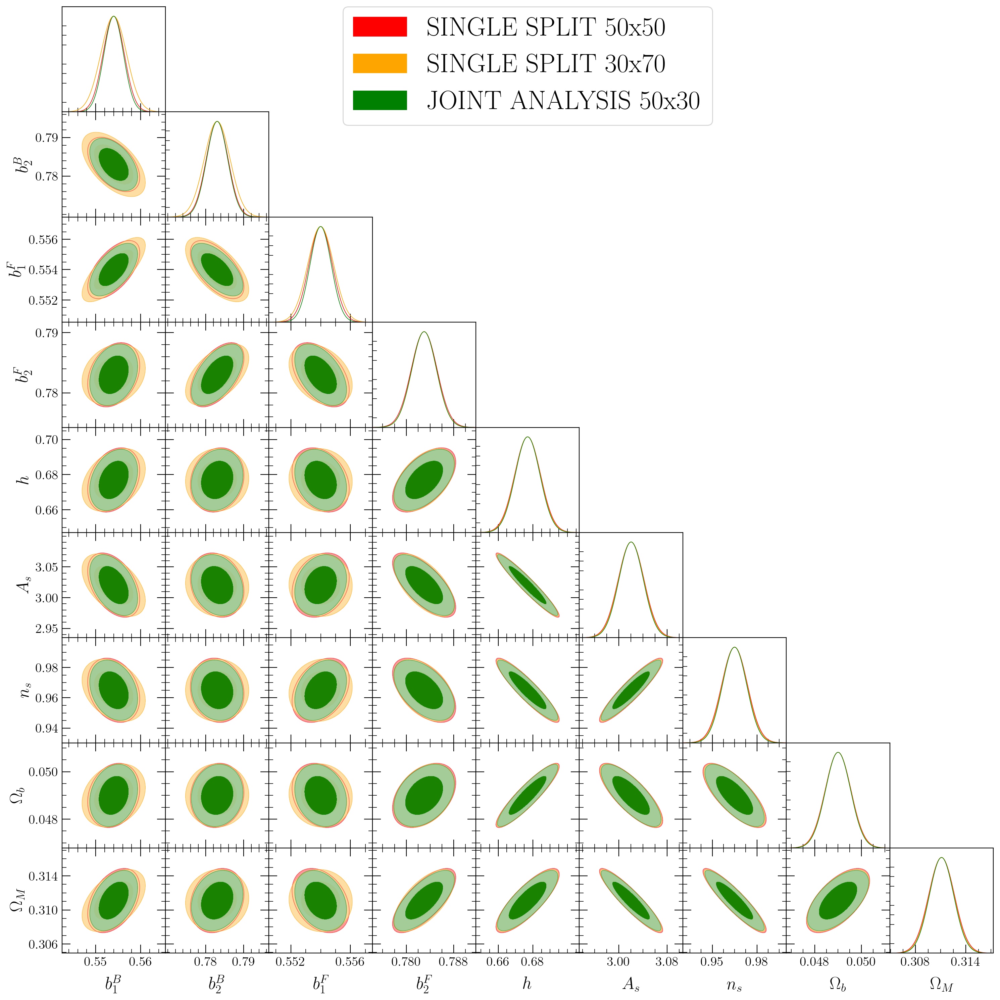

In [101]:
# Triangle plot: GALAXY BIAS AND COSMIC PARAMETERS

mean_50 = params_fid_

gbias_names = ['b1B_m1', 'b2B_m1', 'b1F_m1', 'b2F_m1']
cosmic_names = ['h', 'As', 'ns', 'Ob', 'OM']

gbias_labels = [r'b_1^{B}', r'b_2^{B}', r'b_1^{F}', r'b_2^{F}']
cosmic_labels = [r'h', r'A_s', r'n_s', r'\Omega_b', r'\Omega_M']

param_names = gbias_names + cosmic_names
labels = gbias_labels + cosmic_labels

GaussDist_gbias_cosmic_fit = GaussianND(mean_50, Sigma_Matrix_Joint50x30_, labels = labels, names = param_names)
GaussDist_gbias_cosmic_fit_50 = GaussianND(mean_50, Sigma_Matrix_50[12:, 12:], labels = labels, names = param_names)
GaussDist_gbias_cosmic_fit_30 = GaussianND(mean_50, Sigma_Matrix_30[12:, 12:], labels = labels, names = param_names)


g = plots.get_subplot_plotter(width_inch=15)
g.settings.legend_frame = True
g.settings.alpha_filled_add=0.9
g.settings.legend_fontsize=32
g.settings.axes_fontsize=18
g.settings.axes_labelsize=22
g.settings.axis_tick_max_labels=6

g.triangle_plot([GaussDist_gbias_cosmic_fit_50, GaussDist_gbias_cosmic_fit_30, GaussDist_gbias_cosmic_fit], param_names, 
                filled=True, 
                legend_labels=['SINGLE SPLIT 50x50', 'SINGLE SPLIT 30x70','JOINT ANALYSIS 50x30'],
                contour_colors=['red', 'orange', 'green'])

# Predictions from the JOINT ANALYSIS

## Magnification bias

In [102]:
# Magnification bias fit

def magbias_fit(params, x):
    a, b, c, d = params
    return  a + b * x + c * np.log(x) + d * (np.log(x))**2

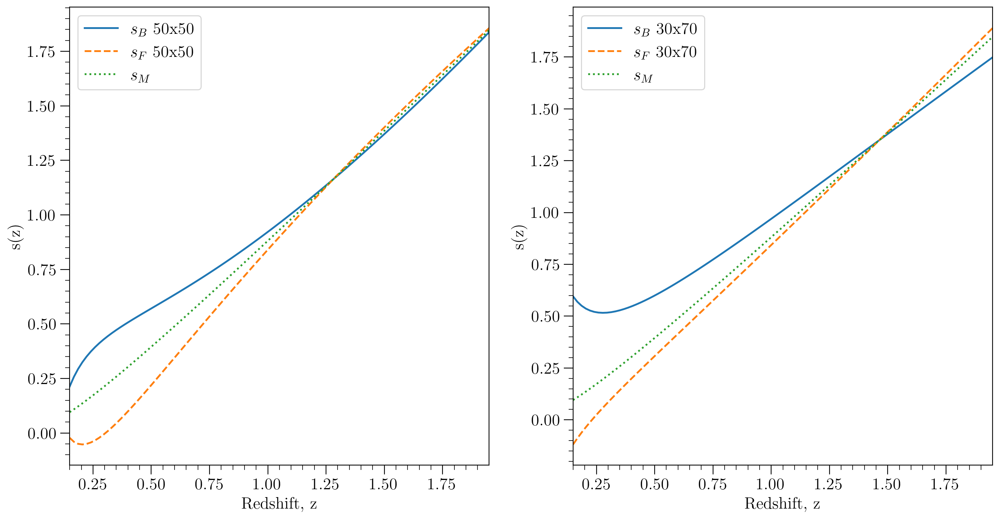

In [103]:
z_lin = np.linspace(z_bins[0], z_bins[-1], 100)

m_50 = 2.
m_30 = 10/3.

sB_fid_50 = magbias_fit(sB_fit[:4], z_lin)
sB_fid_30 = magbias_fit(sB_fit[4:], z_lin)
sM_fid = magbias_fit(sM_4fit, z_lin)
sF_fid_50 = sM_fid * (m_50/(m_50-1)) - sB_fid_50/(m_50-1)
sF_fid_30 = sM_fid * (m_30/(m_30-1)) - sB_fid_30/(m_30-1)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

ax[0].plot(z_lin, sB_fid_50, '-', label=r'$s_B$ 50x50')
ax[0].plot(z_lin, sF_fid_50, '--', label=r'$s_F$ 50x50')
ax[0].plot(z_lin, sM_fid, ':', label=r'$s_M$')

ax[1].plot(z_lin, sB_fid_30, '-', label=r'$s_B$ 30x70')
ax[1].plot(z_lin, sF_fid_30, '--', label=r'$s_F$ 30x70')
ax[1].plot(z_lin, sM_fid, ':', label=r'$s_M$')


for axi in ax:
    axi.set_xlim(0.15, 1.95)
    axi.set_xlabel(r'Redshift, z')
    axi.set_ylabel(r's(z)')
    axi.legend();


### Observables: $s_B(z)$ and $s_M(z)$

In [104]:
# Compute priors 

# Select the marginalized covariance matrix for the magnification biases priors

cov_sB_50_priors = Cov_prior_all[:4, :4]
cov_sB_30_priors = Cov_prior_all[4:8, 4:8]
cov_sM_priors = Cov_prior_all[8:12, 8:12]

# Generate parameter samples from multivariate normal distribution

##np.random.seed(36)

num_samples = 1000
sB_50_pars_samples_priors = np.random.multivariate_normal(sB_4fit50, cov_sB_50_priors, num_samples)
sB_30_pars_samples_priors = np.random.multivariate_normal(sB_4fit30, cov_sB_30_priors, num_samples)
sM_pars_samples_priors = np.random.multivariate_normal(sM_4fit, cov_sM_priors, num_samples)

# Evaluate fitting function for each parameter sample

sB_50_samples_priors = np.array([magbias_fit(pars, z_lin) for pars in sB_50_pars_samples_priors])
sB_30_samples_priors = np.array([magbias_fit(pars, z_lin) for pars in sB_30_pars_samples_priors])

sM_samples_priors = np.array([magbias_fit(pars, z_lin) for pars in sM_pars_samples_priors])

# Calculate the 68% confidence interval

sB_50_lower_bound_priors = np.percentile(sB_50_samples_priors, 16, axis=0)
sB_50_upper_bound_priors = np.percentile(sB_50_samples_priors, 84, axis=0)

sB_30_lower_bound_priors = np.percentile(sB_30_samples_priors, 16, axis=0)
sB_30_upper_bound_priors = np.percentile(sB_30_samples_priors, 84, axis=0)

sM_lower_bound_priors = np.percentile(sM_samples_priors, 16, axis=0)
sM_upper_bound_priors = np.percentile(sM_samples_priors, 84, axis=0)


###### Compare the two observables

In [105]:
Sigma_Matrix_Joint50x30[:4, :4]

array([[ 0.04570435, -0.03685026,  0.04035766,  0.0102929 ],
       [-0.03685026,  0.0592362 , -0.03014407, -0.00811258],
       [ 0.04035766, -0.03014407,  0.039586  ,  0.01091063],
       [ 0.0102929 , -0.00811258,  0.01091063,  0.00323799]])

In [106]:
# Select the marginalized covariance matrix for the magnification biases

cov_sB_Joint_50 = Sigma_Matrix_Joint50x30[:4, :4]
cov_sB_Joint_30 = Sigma_Matrix_Joint50x30[4:8, 4:8]
cov_sM_Joint = Sigma_Matrix_Joint50x30[8:12, 8:12]

# Generate parameter samples from multivariate normal distribution

##np.random.seed(36)

num_samples = 1000
sB_Joint_50_pars_samples = np.random.multivariate_normal(sB_4fit50, cov_sB_Joint_50, num_samples)
sB_Joint_30_pars_samples = np.random.multivariate_normal(sB_4fit30, cov_sB_Joint_30, num_samples)
sM_Joint_pars_samples = np.random.multivariate_normal(sM_4fit, cov_sM_Joint, num_samples)

# Evaluate fitting function for each parameter sample
sB_Joint_50_samples = np.array([magbias_fit(pars, z_lin) for pars in sB_Joint_50_pars_samples])
sB_Joint_30_samples = np.array([magbias_fit(pars, z_lin) for pars in sB_Joint_30_pars_samples])
sM_Joint_samples = np.array([magbias_fit(pars, z_lin) for pars in sM_Joint_pars_samples])

# Calculate the 68% confidence interval
sB_Joint_50_lower_bound = np.percentile(sB_Joint_50_samples, 16, axis=0)
sB_Joint_50_upper_bound = np.percentile(sB_Joint_50_samples, 84, axis=0)

sB_Joint_30_lower_bound = np.percentile(sB_Joint_30_samples, 16, axis=0)
sB_Joint_30_upper_bound = np.percentile(sB_Joint_30_samples, 84, axis=0)

sM_Joint_lower_bound = np.percentile(sM_Joint_samples, 16, axis=0)
sM_Joint_upper_bound = np.percentile(sM_Joint_samples, 84, axis=0)

Predictions for $s_B(z)$ vs Priors

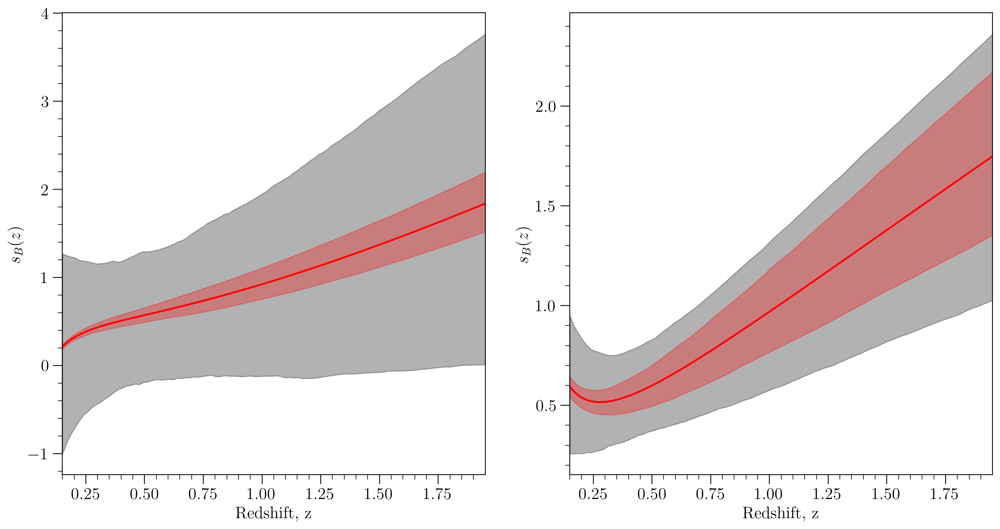

In [107]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

ax[0].plot(z_lin, sB_fid_50, 'r-')
ax[0].fill_between(z_lin, sB_50_lower_bound_priors, sB_50_upper_bound_priors, color='black', alpha=0.3)
ax[0].fill_between(z_lin, sB_Joint_50_lower_bound, sB_Joint_50_upper_bound, color='red', alpha=0.3)

ax[1].plot(z_lin, sB_fid_30, 'r-')
ax[1].fill_between(z_lin, sB_30_lower_bound_priors, sB_30_upper_bound_priors, color='black', alpha=0.3)
ax[1].fill_between(z_lin, sB_Joint_30_lower_bound, sB_Joint_30_upper_bound, color='red', alpha=0.3)

for axi in ax:
    axi.set_xlim(0.15, 1.95)
    axi.set_xlabel(r'Redshift, z')
    axi.set_ylabel(r'$s_B(z)$')

Predictions for $s_M(z)$ vs Priors

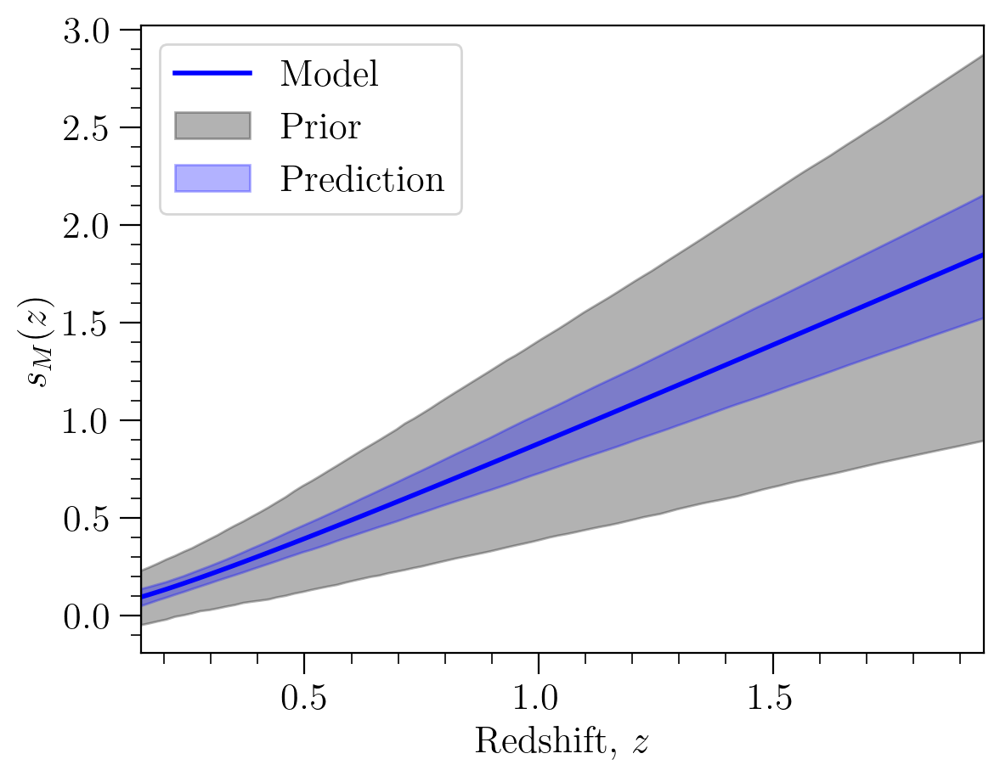

In [108]:
plt.plot(z_lin, sM_fid, '-', lw = 2.0, color='blue', label = 'Model')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sM_lower_bound_priors, sM_upper_bound_priors, color='black', alpha=0.3, label = r'Prior')
plt.fill_between(z_lin, sM_Joint_lower_bound, sM_Joint_upper_bound, color='blue', alpha=0.3, label = r'Prediction')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_M(z)$');
plt.legend(loc='upper left');

### Magnification bias of the Faint, $s_F(z)$

The magnification bias of the faint population is obtained by:

$$ s_F(z) = s_{model}(z)\frac{\bar{N}(z)}{\bar{N}_F(z)} - s_B(z)\frac{\bar{N}_B(z)}{\bar{N}_F(z)} = s_F(z) = s_{model}(z)\frac{m}{m-1} - s_B(z)\frac{1}{m-1} $$ 

We need to sample together the $s_B$ and $s_m$ parameters.

In [109]:
sbias_fid = np.concatenate([sB_4fit50, sB_4fit30, sM_4fit])

np.shape(sbias_fid)

(12,)

In [110]:
# Select the marginalized covariance matrix for the magnification biases together
cov_sbias = Sigma_Matrix_Joint50x30[:12, :12]

# Generate parameter samples from multivariate normal distribution

##np.random.seed(36)

num_samples = 1000
sbias_Joint_pars_samples = np.random.multivariate_normal(sbias_fid, cov_sbias, num_samples)

# Evaluate fitting function for each parameter sample
sB_Joint_50_samples_ = np.array([magbias_fit(pars[:4], z_lin) for pars in sbias_Joint_pars_samples])
sB_Joint_30_samples_ = np.array([magbias_fit(pars[4:8], z_lin) for pars in sbias_Joint_pars_samples])
sM_Joint_samples_ = np.array([magbias_fit(pars[8:12], z_lin) for pars in sbias_Joint_pars_samples])

# Compute the sF for each sample
sF_50_samples_ = sM_Joint_samples_*m_50/(m_50-1) - sB_Joint_50_samples_/(m_50-1)
sF_30_samples_ = sM_Joint_samples_*m_30/(m_30-1) - sB_Joint_30_samples_/(m_30-1)


# Calculate the 68% confidence interval
sF_50_Joint_lower_bound_ = np.percentile(sF_50_samples_, 16, axis=0)
sF_50_Joint_upper_bound_ = np.percentile(sF_50_samples_, 84, axis=0)

sF_30_Joint_lower_bound_ = np.percentile(sF_30_samples_, 16, axis=0)
sF_30_Joint_upper_bound_ = np.percentile(sF_30_samples_, 84, axis=0)

Compare with priors

In [111]:
# Select the marginalized covariance matrix for the magnification biases together
cov_sbias_priors_ = Cov_prior_all[:12, :12]

# Generate parameter samples from multivariate normal distribution

##np.random.seed(36)

num_samples = 1000
sbias_pars_samples_priors_ = np.random.multivariate_normal(sbias_fid, cov_sbias_priors_, num_samples)

# Evaluate fitting function for each parameter sample
sB_50_samples_priors_ = np.array([magbias_fit(pars[:4], z_lin) for pars in sbias_pars_samples_priors_])
sB_30_samples_priors_ = np.array([magbias_fit(pars[4:8], z_lin) for pars in sbias_pars_samples_priors_])
sM_samples_priors_ = np.array([magbias_fit(pars[8:12], z_lin) for pars in sbias_pars_samples_priors_])

# Compute the sF for each sample
sF_50_samples_priors_ = sM_samples_priors_*m_50/(m_50-1) - sB_50_samples_priors_/(m_50-1)
sF_30_samples_priors_ = sM_samples_priors_*m_30/(m_30-1) - sB_30_samples_priors_/(m_30-1)

# Calculate the 68% confidence interval
sF_50_lower_bound_priors_ = np.percentile(sF_50_samples_priors_, 16, axis=0)
sF_50_upper_bound_priors_ = np.percentile(sF_50_samples_priors_, 84, axis=0)

sF_30_lower_bound_priors_ = np.percentile(sF_30_samples_priors_, 16, axis=0)
sF_30_upper_bound_priors_ = np.percentile(sF_30_samples_priors_, 84, axis=0)

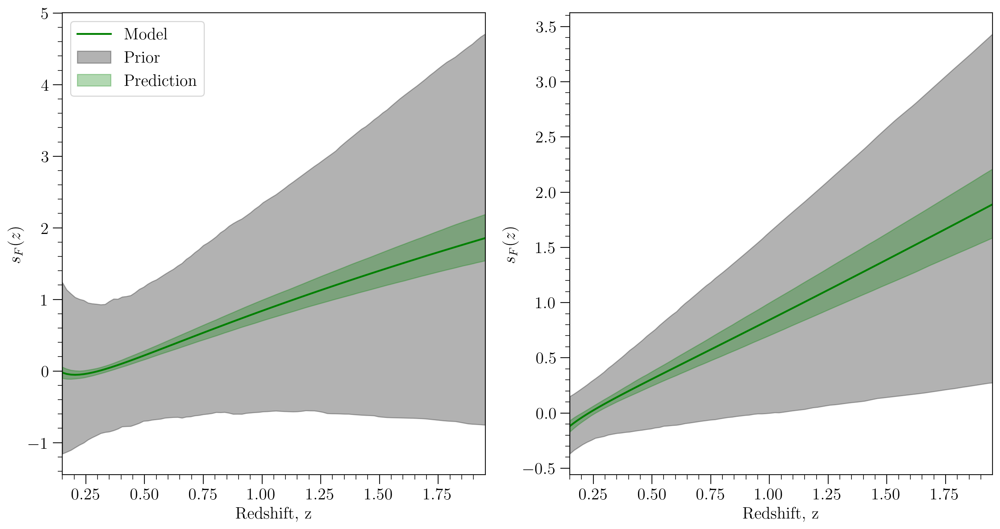

In [112]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

ax[0].plot(z_lin, sF_fid_50, '-', color = 'green', label = 'Model')
ax[0].fill_between(z_lin, sF_50_lower_bound_priors_, sF_50_upper_bound_priors_, color='black', alpha=0.3, label = 'Prior')
ax[0].fill_between(z_lin, sF_50_Joint_lower_bound_, sF_50_Joint_upper_bound_, color='green', alpha=0.3, label = 'Prediction')

ax[1].plot(z_lin, sF_fid_30, '-', color = 'green')
ax[1].fill_between(z_lin, sF_30_lower_bound_priors_, sF_30_upper_bound_priors_, color='black', alpha=0.3)
ax[1].fill_between(z_lin, sF_30_Joint_lower_bound_, sF_30_Joint_upper_bound_, color='green', alpha=0.3)

ax[0].legend(loc='upper left')

for axi in ax:
    axi.set_xlim(0.15, 1.95)
    axi.set_xlabel(r'Redshift, z')
    axi.set_ylabel(r'$s_F(z)$')

## Number evolution

In [113]:
def nevol_fit(params, x):
    a, b, c, d = params
    return a + b * x + c * (1/x) + d * np.exp(-x)

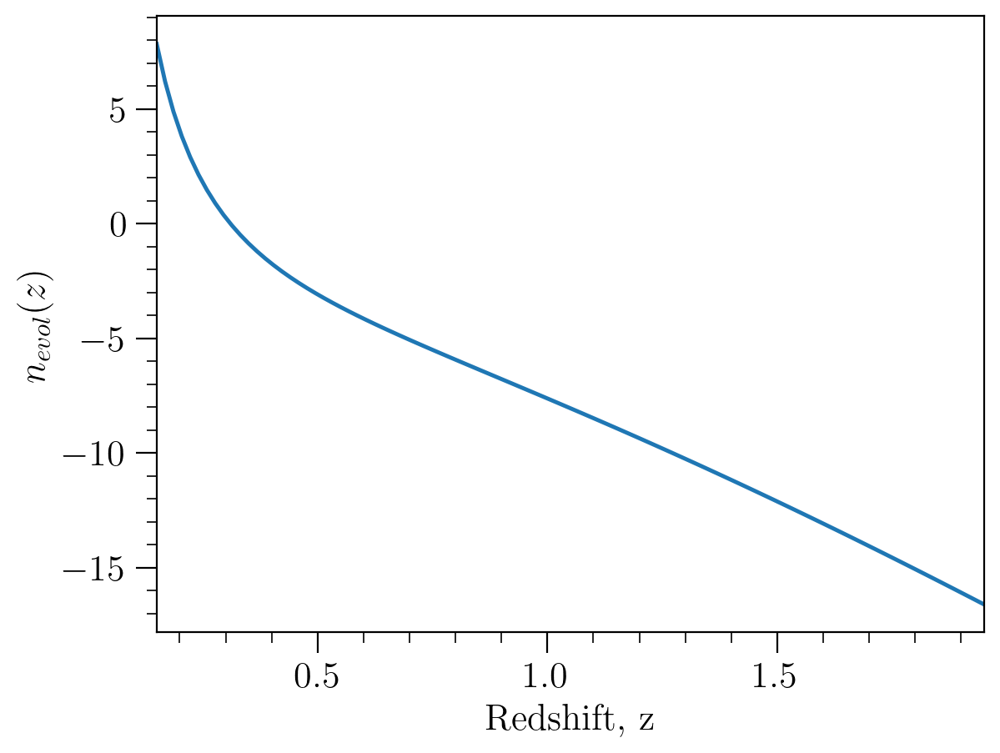

In [114]:
z_lin = np.linspace(z_bins[0], z_bins[-1], 100)
m_split = 2.

num_evol_fid = nevol_fit(num_fit, z_lin)

plt.plot(z_lin, num_evol_fid, '-')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z');
plt.ylabel(r'$n_{evol}(z)$');
#plt.title('Fitting model for the number desnsitiy evolution');

In [115]:
# Select the marginalized covariance matrix for the number evolution
cov_Joint_numevol = Sigma_Matrix_Joint50x30[12:16, 12:16]
cov_numevol_priors = Cov_prior_all[12:16, 12:16]


# Generate parameter samples from multivariate normal distribution

##np.random.seed(36)

num_samples = 1000
nevol_Joint_pars_samples = np.random.multivariate_normal(num_fit, cov_Joint_numevol, num_samples)
nevol_samples_priors = np.random.multivariate_normal(num_fit, cov_numevol_priors, num_samples)


# Evaluate fitting function for each parameter sample
nevol_Joint_samples = np.array([nevol_fit(pars, z_lin) for pars in nevol_Joint_pars_samples])
nevol_samples_priors = np.array([nevol_fit(pars, z_lin) for pars in nevol_samples_priors])

# Calculate the 68% confidence interval
nevol_Joint_lower_bound = np.percentile(nevol_Joint_samples, 16, axis=0)
nevol_Joint_upper_bound = np.percentile(nevol_Joint_samples, 84, axis=0)
nevol_lower_bound_priors = np.percentile(nevol_samples_priors, 16, axis=0)
nevol_upper_bound_priors = np.percentile(nevol_samples_priors, 84, axis=0)

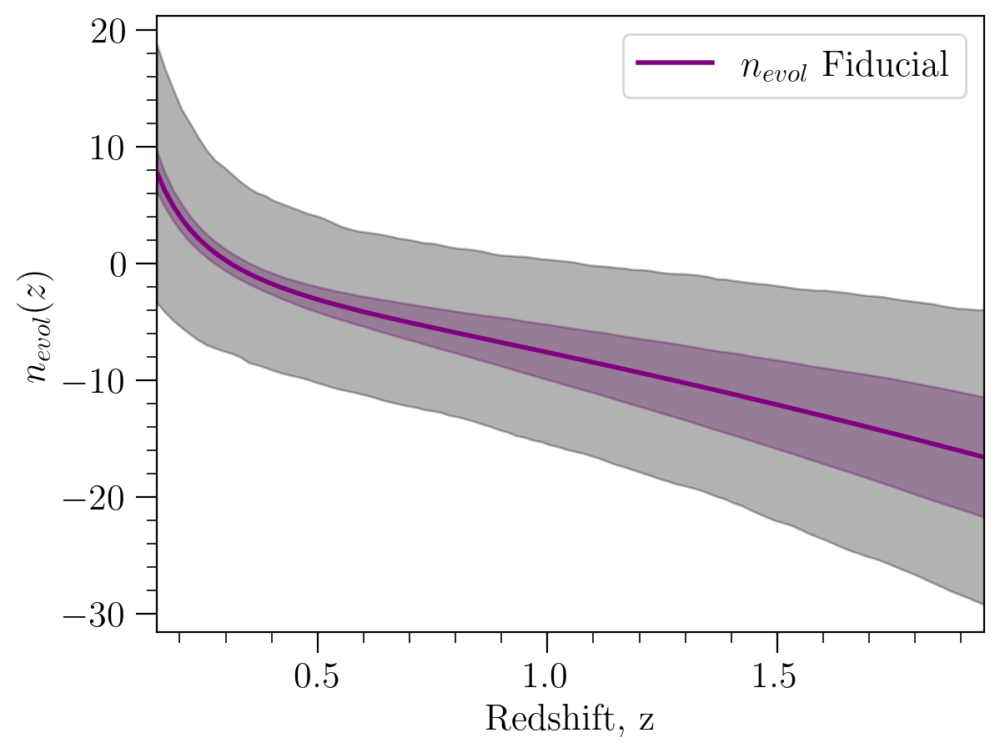

In [116]:
plt.plot(z_lin, num_evol_fid, '-', color='purple', label=r'$n_{evol}$'+' Fiducial', lw = 2.0)

# Shade the 68% confidence interval

plt.fill_between(z_lin, nevol_Joint_lower_bound, nevol_Joint_upper_bound, color='purple', alpha=0.3)
plt.fill_between(z_lin, nevol_lower_bound_priors, nevol_upper_bound_priors, color='black', alpha=0.3)


plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$n_{evol}(z)$')
plt.legend();

## Evolution bias

The evolution bias is computed from the magnification biases and the evolution of the number densities.

$$ f^{evol}_{B}(z) = -\frac{d\log{N_B(z)}}{d\log{(1+z)}} - \frac{d\log{H(z)}}{d\log{(1+z)}} + \frac{2(1+z)}{r(z)H(z)} -5\,s_B(z)\left(1+\frac{(1+z)}{r(z)H(z)}\right) - \frac{5}{2}s_B(z)\,\frac{d\log{F_c}}{d\log{(1+z)}} $$

$$ f^{evol}_{F}(z) = -\frac{d\log{N_F(z)}}{d\log{(1+z)}} - \frac{d\log{H(z)}}{d\log{(1+z)}} + \frac{2(1+z)}{r(z)H(z)} -5\,s_F(z)\left(1+\frac{(1+z)}{r(z)H(z)}\right) 
    - \frac{5}{2}\left[\frac{\bar{N}}{\bar{N}_F}\,s_{model}(z)\frac{d\log{F_*}}{d\log{(1+z)}}-\frac{\bar{N}_B}{\bar{N}_F}\,s_B(z)\frac{d\log{F_c}}{d\log{(1+z)}}\right] $$

We have all the ingredients defined as methods in the EvolutionBias class. We need to extract the relevant terms and then sample togeter the $n_{evol}$ and magnification bias parameters to construct the predictions for each evolution bias. 

In [117]:
from biasmodels import EvolutionBias

In [118]:
myEvolBias_50 = EvolutionBias(n_split=m_50)
myEvolBias_30 = EvolutionBias(n_split=m_30)


dlogH = myEvolBias_50.dlogH
rHterm = myEvolBias_50.rHterm
dFstar = myEvolBias_50.dLogFstar
dFcut = myEvolBias_50.dLogFcut

In [119]:
def fevol_bright(pars_s, pars_n, z):
    pars_sB = pars_s[:4] 
    return - nevol_fit(params=pars_n, x=z) - dlogH(z) + (2 - 5*magbias_fit(params=pars_sB, x=z))*rHterm(z) - 5*magbias_fit(params=pars_sB, x=z) - 5/2*magbias_fit(params=pars_sB, x=z)*dFcut(z)
    
def fevol_faint(pars_s, pars_n, z):
    
    pars_sB = pars_s[:4]
    pars_sM = pars_s[4:]
    s_B = magbias_fit(params=pars_sB, x=z)
    s_M = magbias_fit(params=pars_sM, x=z)
    s_faint = s_M*m_split/(m_split-1) - s_B/(m_split-1)
    
    return - nevol_fit(params=pars_n, x=z) - dlogH(z) + (2 - 5*s_faint)*rHterm(z) - 5*s_faint + 5/2*((1/(m_split-1)) * s_B *dFcut(z) - (m_split/(m_split-1)) * s_M *dFstar(z))

In [120]:
sbias_fid_50 = np.concatenate([sB_4fit50, sM_4fit])
sbias_fid_30 = np.concatenate([sB_4fit30, sM_4fit])

np.shape(sbias_fid_50), np.shape(sbias_fid_30)

((8,), (8,))

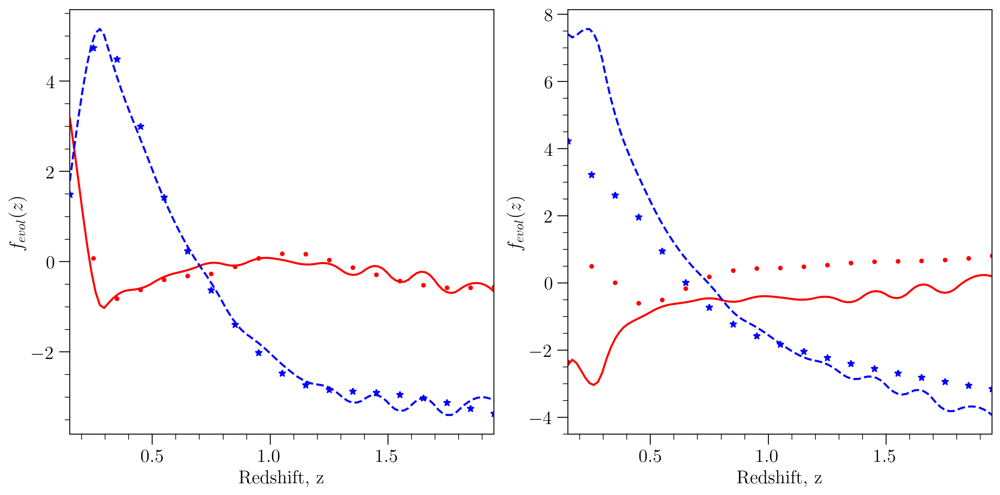

In [121]:
z_lin = np.linspace(z_bins[0], z_bins[-1], 100)

fevol_50_B_fid = fevol_bright(pars_s = sbias_fid_50, pars_n = num_fit, z = z_lin)
fevol_50_F_fid = fevol_faint(pars_s = sbias_fid_50, pars_n = num_fit, z = z_lin)

fevol_30_B_fid = fevol_bright(pars_s = sbias_fid_30, pars_n = num_fit, z = z_lin)
fevol_30_F_fid = fevol_faint(pars_s = sbias_fid_30, pars_n = num_fit, z = z_lin)

feB_50 = myEvolBias_50.fevol_bright(z_bins)
feF_50 = myEvolBias_50.fevol_faint(z_bins)

feB_30 = myEvolBias_30.fevol_bright(z_bins)
feF_30 = myEvolBias_30.fevol_faint(z_bins)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6), tight_layout=True)

ax[0].plot(z_lin, fevol_50_B_fid, 'r-')
ax[0].plot(z_lin, fevol_50_F_fid, 'b--')
ax[0].plot(z_bins, feB_50, 'r.', label='Bright')
ax[0].plot(z_bins, feF_50, 'b*', label='Faint')

ax[1].plot(z_lin, fevol_30_B_fid, 'r-')
ax[1].plot(z_lin, fevol_30_F_fid, 'b--')
ax[1].plot(z_bins, feB_30, 'r.', label='Bright')
ax[1].plot(z_bins, feF_30, 'b*', label='Faint')

for axi in ax:
    axi.set_xlim(z_bins[0],z_bins[-1])
    axi.set_xlim(z_bins[0],z_bins[-1])
    axi.set_xlabel(r'Redshift, z');
    axi.set_ylabel(r'$f_{evol}(z)$');

In [122]:
list(range(4,8))

[4, 5, 6, 7]

In [123]:
# Select the marginalized covariance matrix for the parameters

cov_Joint_all = Sigma_Matrix_Joint50x30[:16, :16]
cov_all_priors = Cov_prior_all[:16, :16]

all_fid = np.concatenate([sbias_fid, num_fit])

# Generate parameter samples from multivariate normal distribution

##np.random.seed(36)

num_samples = 1000
all_Joint_pars_samples = np.random.multivariate_normal(all_fid, cov_Joint_all, num_samples)
all_pars_samples_priors = np.random.multivariate_normal(all_fid, cov_all_priors, num_samples)

nind_50 = list(range(4,8))

all_Joint_50_pars_samples = all_Joint_pars_samples
all_Joint_50_pars_samples = np.delete(all_Joint_50_pars_samples, nind_50, axis=1)
all_50_pars_samples_priors = all_pars_samples_priors
all_50_pars_samples_priors = np.delete(all_50_pars_samples_priors, nind_50, axis=1)

nind_30 = list(range(0,4))

all_Joint_30_pars_samples = all_Joint_pars_samples
all_Joint_30_pars_samples = np.delete(all_Joint_30_pars_samples, nind_30, axis=1)
all_30_pars_samples_priors = all_pars_samples_priors
all_30_pars_samples_priors = np.delete(all_30_pars_samples_priors, nind_30, axis=1)

In [124]:
# Evaluate fitting function for each parameter sample

fevol_Joint_50_B_samples = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_Joint_50_pars_samples])
fevol_Joint_50_B_samples_priors = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_50_pars_samples_priors])
fevol_Joint_50_F_samples = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_Joint_50_pars_samples])
fevol_Joint_50_F_samples_priors = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_50_pars_samples_priors])

fevol_Joint_30_B_samples = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_Joint_30_pars_samples])
fevol_Joint_30_B_samples_priors = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_30_pars_samples_priors])
fevol_Joint_30_F_samples = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_Joint_30_pars_samples])
fevol_Joint_30_F_samples_priors = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_30_pars_samples_priors])

# Calculate the 68% confidence intervals

fevol_B_50_lower_bound = np.percentile(fevol_Joint_50_B_samples, 16, axis=0)
fevol_B_50_upper_bound = np.percentile(fevol_Joint_50_B_samples, 84, axis=0)
fevol_B_50_lower_bound_priors = np.percentile(fevol_Joint_50_B_samples_priors, 16, axis=0)
fevol_B_50_upper_bound_priors = np.percentile(fevol_Joint_50_B_samples_priors, 84, axis=0)

fevol_F_50_lower_bound = np.percentile(fevol_Joint_50_F_samples, 16, axis=0)
fevol_F_50_upper_bound = np.percentile(fevol_Joint_50_F_samples, 84, axis=0)
fevol_F_50_lower_bound_priors = np.percentile(fevol_Joint_50_F_samples_priors, 16, axis=0)
fevol_F_50_upper_bound_priors = np.percentile(fevol_Joint_50_F_samples_priors, 84, axis=0)

fevol_B_30_lower_bound = np.percentile(fevol_Joint_30_B_samples, 16, axis=0)
fevol_B_30_upper_bound = np.percentile(fevol_Joint_30_B_samples, 84, axis=0)
fevol_B_30_lower_bound_priors = np.percentile(fevol_Joint_30_B_samples_priors, 16, axis=0)
fevol_B_30_upper_bound_priors = np.percentile(fevol_Joint_30_B_samples_priors, 84, axis=0)

fevol_F_30_lower_bound = np.percentile(fevol_Joint_30_F_samples, 16, axis=0)
fevol_F_30_upper_bound = np.percentile(fevol_Joint_30_F_samples, 84, axis=0)
fevol_F_30_lower_bound_priors = np.percentile(fevol_Joint_30_F_samples_priors, 16, axis=0)
fevol_F_30_upper_bound_priors = np.percentile(fevol_Joint_30_F_samples_priors, 84, axis=0)

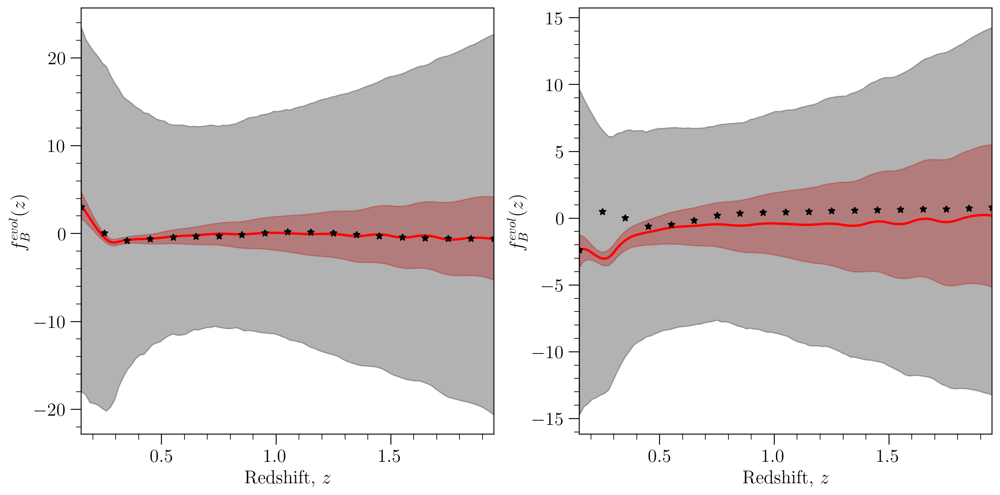

In [125]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6), tight_layout=True)

ax[0].plot(z_lin, fevol_50_B_fid, '-', color='red', lw = 2.0)
ax[0].plot(z_bins, feB_50, '*', color='black')
ax[1].plot(z_lin, fevol_30_B_fid, '-', color='red', lw = 2.0)
ax[1].plot(z_bins, feB_30, '*', color='black')

# Shade the 68% confidence interval

ax[0].fill_between(z_lin, fevol_B_50_lower_bound, fevol_B_50_upper_bound, color='red', alpha=0.3)
ax[0].fill_between(z_lin, fevol_B_50_lower_bound_priors, fevol_B_50_upper_bound_priors, color='black', alpha=0.3)

ax[1].fill_between(z_lin, fevol_B_30_lower_bound, fevol_B_30_upper_bound, color='red', alpha=0.3)
ax[1].fill_between(z_lin, fevol_B_30_lower_bound_priors, fevol_B_30_upper_bound_priors, color='black', alpha=0.3)

for axi in ax:
    axi.set_xlim(0.15,1.95)
    axi.set_xlabel(r'Redshift, $z$')
    axi.set_ylabel(r'$f^{evol}_B(z)$')

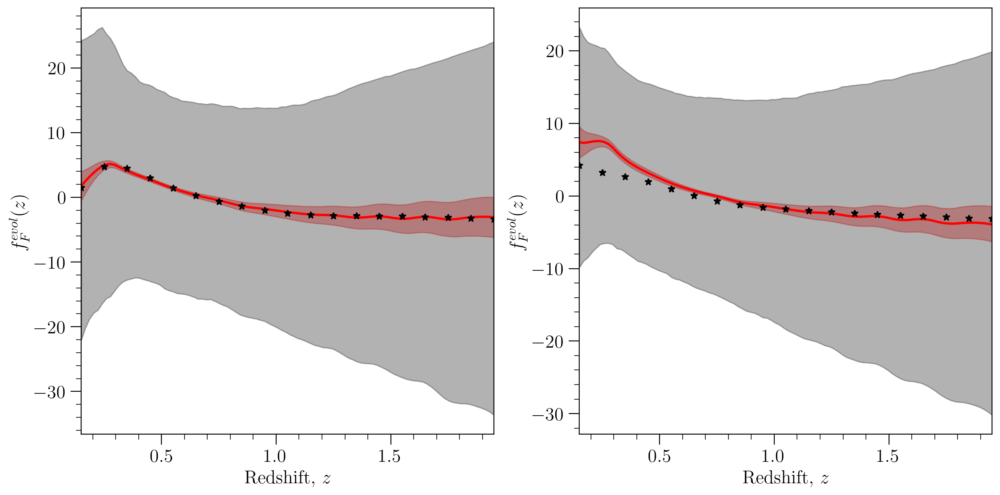

In [126]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6), tight_layout=True)

ax[0].plot(z_lin, fevol_50_F_fid, '-', color='red', lw = 2.0)
ax[0].plot(z_bins, feF_50, '*', color='black')
ax[1].plot(z_lin, fevol_30_F_fid, '-', color='red', lw = 2.0)
ax[1].plot(z_bins, feF_30, '*', color='black')

# Shade the 68% confidence interval

ax[0].fill_between(z_lin, fevol_F_50_lower_bound, fevol_F_50_upper_bound, color='red', alpha=0.3)
ax[0].fill_between(z_lin, fevol_F_50_lower_bound_priors, fevol_F_50_upper_bound_priors, color='black', alpha=0.3)

ax[1].fill_between(z_lin, fevol_F_30_lower_bound, fevol_F_30_upper_bound, color='red', alpha=0.3)
ax[1].fill_between(z_lin, fevol_F_30_lower_bound_priors, fevol_F_30_upper_bound_priors, color='black', alpha=0.3)

for axi in ax:
    axi.set_xlim(0.15,1.95)
    axi.set_xlabel(r'Redshift, $z$')
    axi.set_ylabel(r'$f^{evol}_F(z)$')

# Comparison with Individual Splits

## Magnification bias

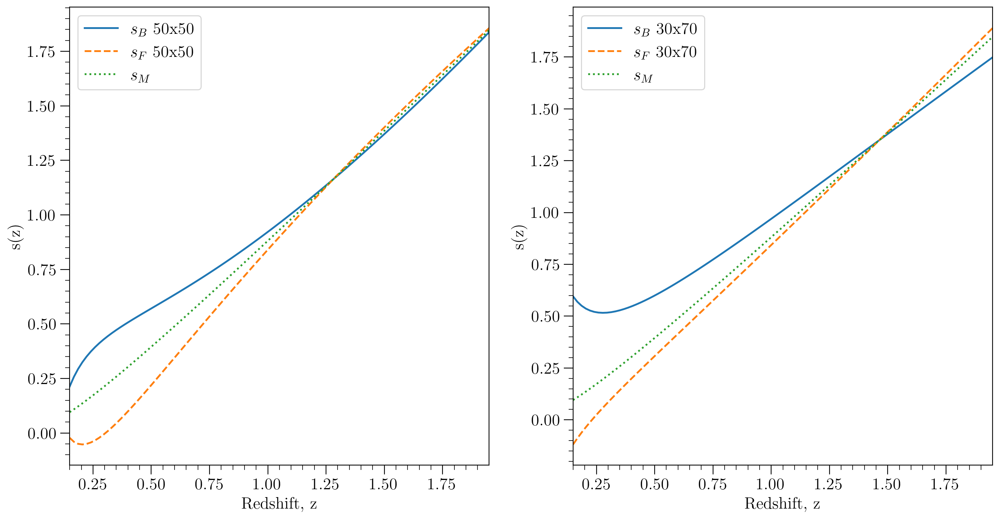

In [147]:
z_lin = np.linspace(z_bins[0], z_bins[-1], 100)

m_50 = 2.
m_30 = 10/3.

sB_fid_50 = magbias_fit(sB_fit[:4], z_lin)
sB_fid_30 = magbias_fit(sB_fit[4:], z_lin)
sM_fid = magbias_fit(sM_4fit, z_lin)
sF_fid_50 = sM_fid * (m_50/(m_50-1)) - sB_fid_50/(m_50-1)
sF_fid_30 = sM_fid * (m_30/(m_30-1)) - sB_fid_30/(m_30-1)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

ax[0].plot(z_lin, sB_fid_50, '-', label=r'$s_B$ 50x50')
ax[0].plot(z_lin, sF_fid_50, '--', label=r'$s_F$ 50x50')
ax[0].plot(z_lin, sM_fid, ':', label=r'$s_M$')

ax[1].plot(z_lin, sB_fid_30, '-', label=r'$s_B$ 30x70')
ax[1].plot(z_lin, sF_fid_30, '--', label=r'$s_F$ 30x70')
ax[1].plot(z_lin, sM_fid, ':', label=r'$s_M$')


for axi in ax:
    axi.set_xlim(0.15, 1.95)
    axi.set_xlabel(r'Redshift, z')
    axi.set_ylabel(r's(z)')
    axi.legend();


### Observables: $s_B(z)$ and $s_M(z)$

In [148]:
# Compute priors 

# Select the marginalized covariance matrix for the magnification biases priors

cov_sB_50_priors = Cov_prior_all[:4, :4]
cov_sB_30_priors = Cov_prior_all[4:8, 4:8]
cov_sM_priors = Cov_prior_all[8:12, 8:12]

# Generate parameter samples from multivariate normal distribution

##np.random.seed(36)

num_samples = 1000
sB_50_pars_samples_priors = np.random.multivariate_normal(sB_4fit50, cov_sB_50_priors, num_samples)
sB_30_pars_samples_priors = np.random.multivariate_normal(sB_4fit30, cov_sB_30_priors, num_samples)
sM_pars_samples_priors = np.random.multivariate_normal(sM_4fit, cov_sM_priors, num_samples)

# Evaluate fitting function for each parameter sample

sB_50_samples_priors = np.array([magbias_fit(pars, z_lin) for pars in sB_50_pars_samples_priors])
sB_30_samples_priors = np.array([magbias_fit(pars, z_lin) for pars in sB_30_pars_samples_priors])

sM_samples_priors = np.array([magbias_fit(pars, z_lin) for pars in sM_pars_samples_priors])

# Calculate the 68% confidence interval

sB_50_lower_bound_priors = np.percentile(sB_50_samples_priors, 16, axis=0)
sB_50_upper_bound_priors = np.percentile(sB_50_samples_priors, 84, axis=0)

sB_30_lower_bound_priors = np.percentile(sB_30_samples_priors, 16, axis=0)
sB_30_upper_bound_priors = np.percentile(sB_30_samples_priors, 84, axis=0)

sM_lower_bound_priors = np.percentile(sM_samples_priors, 16, axis=0)
sM_upper_bound_priors = np.percentile(sM_samples_priors, 84, axis=0)


In [149]:
np.shape(Sigma_Matrix_30)

(21, 21)

In [150]:
# Select the marginalized covariance matrix for the magnification biases

cov_sB_50 = Sigma_Matrix_50[:4, :4]
cov_sB_30 = Sigma_Matrix_30[:4, :4]
cov_sM_50 = Sigma_Matrix_50[4:8, 4:8]
cov_sM_30 = Sigma_Matrix_30[4:8, 4:8]

# Generate parameter samples from multivariate normal distribution

##np.random.seed(36)

num_samples = 1000
sB_50_pars_samples = np.random.multivariate_normal(sB_4fit50, cov_sB_50, num_samples)
sB_30_pars_samples = np.random.multivariate_normal(sB_4fit30, cov_sB_30, num_samples)
sM_50_pars_samples = np.random.multivariate_normal(sM_4fit, cov_sM_50, num_samples)
sM_30_pars_samples = np.random.multivariate_normal(sM_4fit, cov_sM_30, num_samples)

# Evaluate fitting function for each parameter sample
sB_50_samples = np.array([magbias_fit(pars, z_lin) for pars in sB_50_pars_samples])
sB_30_samples = np.array([magbias_fit(pars, z_lin) for pars in sB_30_pars_samples])
sM_50_samples = np.array([magbias_fit(pars, z_lin) for pars in sM_50_pars_samples])
sM_30_samples = np.array([magbias_fit(pars, z_lin) for pars in sM_30_pars_samples])

# Calculate the 68% confidence interval
sB_50_lower_bound = np.percentile(sB_50_samples, 16, axis=0)
sB_50_upper_bound = np.percentile(sB_50_samples, 84, axis=0)

sB_30_lower_bound = np.percentile(sB_30_samples, 16, axis=0)
sB_30_upper_bound = np.percentile(sB_30_samples, 84, axis=0)

sM_50_lower_bound = np.percentile(sM_50_samples, 16, axis=0)
sM_50_upper_bound = np.percentile(sM_50_samples, 84, axis=0)
sM_30_lower_bound = np.percentile(sM_30_samples, 16, axis=0)
sM_30_upper_bound = np.percentile(sM_30_samples, 84, axis=0)

Predictions for $s_B(z)$ vs Priors

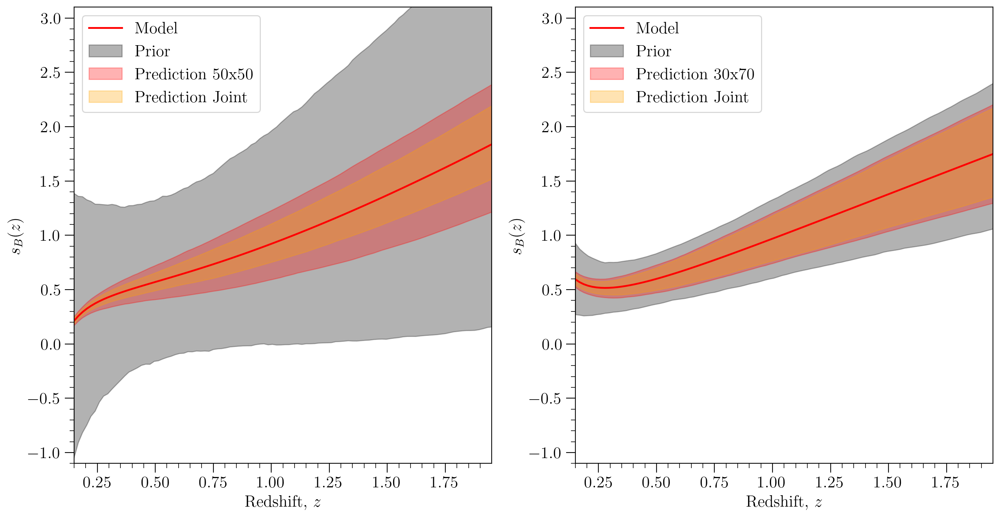

In [151]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

ax[0].plot(z_lin, sB_fid_50, 'r-', label = r'Model')
ax[0].fill_between(z_lin, sB_50_lower_bound_priors, sB_50_upper_bound_priors, color='black', alpha=0.3, label = 'Prior')
ax[0].fill_between(z_lin, sB_50_lower_bound, sB_50_upper_bound, color='red', alpha=0.3, label = 'Prediction 50x50')
ax[0].fill_between(z_lin, sB_Joint_50_lower_bound, sB_Joint_50_upper_bound, color='orange', alpha=0.3, label = 'Prediction Joint')
ax[0].legend(loc='upper left')

ax[1].plot(z_lin, sB_fid_30, 'r-', label = r'Model')
ax[1].fill_between(z_lin, sB_30_lower_bound_priors, sB_30_upper_bound_priors, color='black', alpha=0.3, label = 'Prior')
ax[1].fill_between(z_lin, sB_30_lower_bound, sB_30_upper_bound, color='red', alpha=0.3, label = 'Prediction 30x70')
ax[1].fill_between(z_lin, sB_Joint_30_lower_bound, sB_Joint_30_upper_bound, color='orange', alpha=0.3, label = 'Prediction Joint')
ax[1].legend(loc='upper left')

for axi in ax:
    axi.set_xlim(0.15, 1.95)
    axi.set_ylim(-1.1, 3.1)
    axi.set_xlabel(r'Redshift, $z$')
    axi.set_ylabel(r'$s_B(z)$')
    
plt.savefig("plots/sB_prediction_joint_shotnoise_vs_prior50.pdf", bbox_inches='tight', format='pdf')

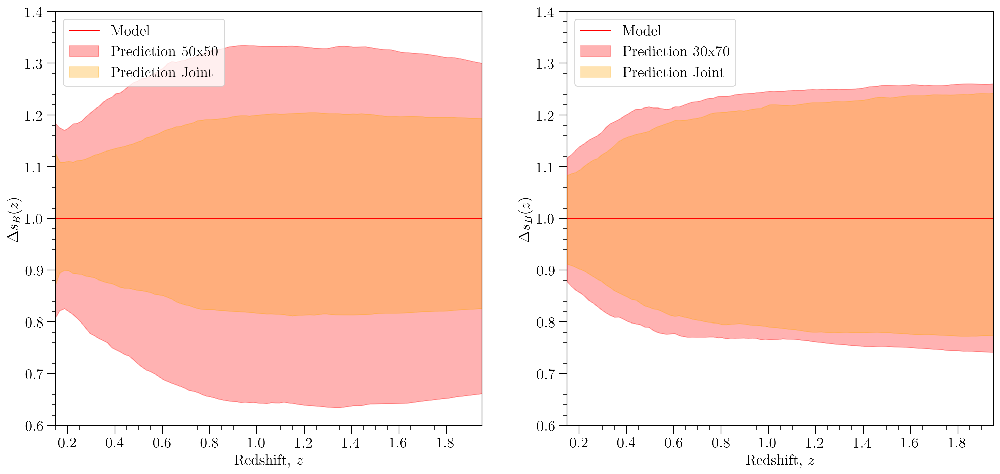

In [152]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (18,8))

ax[0].plot(z_lin, sB_fid_50/sB_fid_50, 'r-', label = r'Model')
#ax[0].fill_between(z_lin, sB_50_lower_bound_priors/sB_fid_50, sB_50_upper_bound_priors/sB_fid_50, color='black', alpha=0.3, label = 'Prior')
ax[0].fill_between(z_lin, sB_50_lower_bound/sB_fid_50, sB_50_upper_bound/sB_fid_50, color='red', alpha=0.3, label = 'Prediction 50x50')
ax[0].fill_between(z_lin, sB_Joint_50_lower_bound/sB_fid_50, sB_Joint_50_upper_bound/sB_fid_50, color='orange', alpha=0.3, label = 'Prediction Joint')
ax[0].legend(loc='upper left')

ax[1].plot(z_lin, sB_fid_30/sB_fid_30, 'r-', label = r'Model')
#ax[1].fill_between(z_lin, sB_30_lower_bound_priors/sB_fid_30, sB_30_upper_bound_priors/sB_fid_30, color='black', alpha=0.3, label = 'Prior')
ax[1].fill_between(z_lin, sB_30_lower_bound/sB_fid_30, sB_30_upper_bound/sB_fid_30, color='red', alpha=0.3, label = 'Prediction 30x70')
ax[1].fill_between(z_lin, sB_Joint_30_lower_bound/sB_fid_30, sB_Joint_30_upper_bound/sB_fid_30, color='orange', alpha=0.3, label = 'Prediction Joint')
ax[1].legend(loc='upper left')

for axi in ax:
    axi.set_xlim(0.15, 1.95)
    axi.set_ylim(0.6, 1.4)
    axi.set_xlabel(r'Redshift, $z$')
    axi.set_ylabel(r'$\Delta s_B(z)$')

Predictions for $s_M(z)$ vs Priors

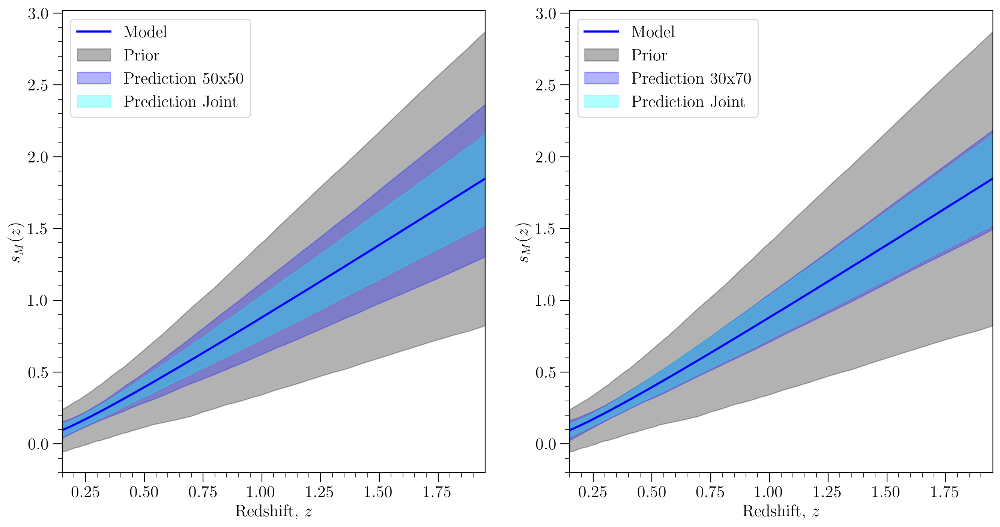

In [153]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

for axi in ax:
    axi.plot(z_lin, sM_fid, '-', lw = 2.0, color='blue', label = 'Model')

# Shade the 68% confidence interval

ax[0].fill_between(z_lin, sM_lower_bound_priors, sM_upper_bound_priors, color='black', alpha=0.3, label = r'Prior')
ax[0].fill_between(z_lin, sM_50_lower_bound, sM_50_upper_bound, color='blue', alpha=0.3, label = r'Prediction 50x50')
ax[0].fill_between(z_lin, sM_Joint_lower_bound, sM_Joint_upper_bound, color='cyan', alpha=0.3, label = r'Prediction Joint')

ax[1].fill_between(z_lin, sM_lower_bound_priors, sM_upper_bound_priors, color='black', alpha=0.3, label = r'Prior')
ax[1].fill_between(z_lin, sM_30_lower_bound, sM_30_upper_bound, color='blue', alpha=0.3, label = r'Prediction 30x70')
ax[1].fill_between(z_lin, sM_Joint_lower_bound, sM_Joint_upper_bound, color='cyan', alpha=0.3, label = r'Prediction Joint')
    
for axi in ax:
    axi.set_xlim(z_bins[0],z_bins[-1])
    axi.set_xlabel(r'Redshift, $z$');
    axi.set_ylabel(r'$s_M(z)$');
    axi.legend(loc='upper left');
    
plt.savefig("plots/sM_prediction_joint_shotnoise_vs_prior50.pdf", bbox_inches='tight', format='pdf')


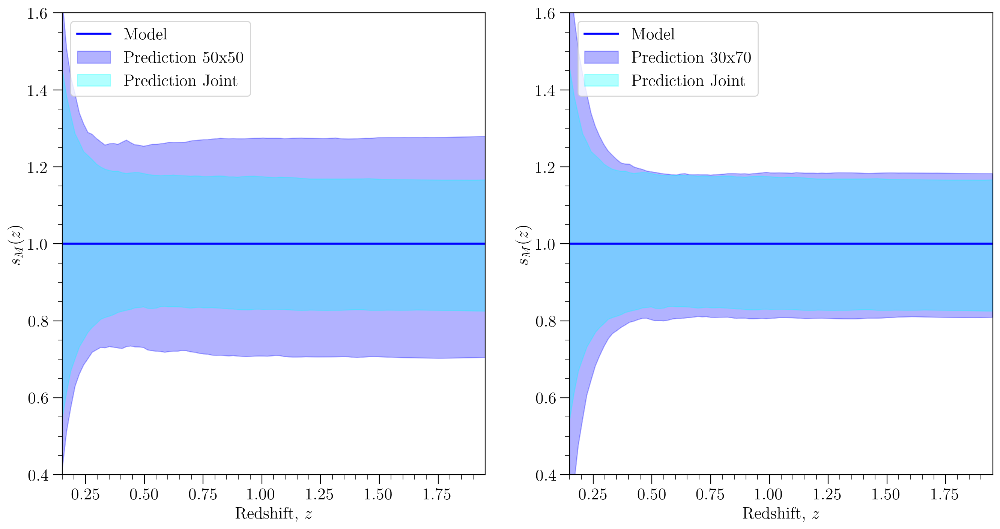

In [154]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

for axi in ax:
    axi.plot(z_lin, sM_fid/sM_fid, '-', lw = 2.0, color='blue', label = 'Model')

# Shade the 68% confidence interval

#ax[0].fill_between(z_lin, sM_lower_bound_priors/sM_fid, sM_upper_bound_priors/sM_fid, color='black', alpha=0.3, label = r'Prior')
ax[0].fill_between(z_lin, sM_50_lower_bound/sM_fid, sM_50_upper_bound/sM_fid, color='blue', alpha=0.3, label = r'Prediction 50x50')
ax[0].fill_between(z_lin, sM_Joint_lower_bound/sM_fid, sM_Joint_upper_bound/sM_fid, color='cyan', alpha=0.3, label = r'Prediction Joint')

#ax[1].fill_between(z_lin, sM_lower_bound_priors, sM_upper_bound_priors, color='black', alpha=0.3, label = r'Prior')
ax[1].fill_between(z_lin, sM_30_lower_bound/sM_fid, sM_30_upper_bound/sM_fid, color='blue', alpha=0.3, label = r'Prediction 30x70')
ax[1].fill_between(z_lin, sM_Joint_lower_bound/sM_fid, sM_Joint_upper_bound/sM_fid, color='cyan', alpha=0.3, label = r'Prediction Joint')
    
for axi in ax:
    axi.set_xlim(z_bins[0],z_bins[-1])
    axi.set_ylim(0.4,1.6)
    axi.set_xlabel(r'Redshift, $z$');
    axi.set_ylabel(r'$s_M(z)$');
    axi.legend(loc='upper left');

### Magnification bias of the Faint, $s_F(z)$

The magnification bias of the faint population is obtained by:

$$ s_F(z) = s_{model}(z)\frac{\bar{N}(z)}{\bar{N}_F(z)} - s_B(z)\frac{\bar{N}_B(z)}{\bar{N}_F(z)} = s_F(z) = s_{model}(z)\frac{m}{m-1} - s_B(z)\frac{1}{m-1} $$ 

We need to sample together the $s_B$ and $s_M$ parameters.

In [155]:
sbias_50_fid = np.concatenate([sB_4fit50, sM_4fit])
sbias_30_fid = np.concatenate([sB_4fit30, sM_4fit])

np.shape(sbias_50_fid), np.shape(sbias_30_fid)

((8,), (8,))

In [156]:
# Select the marginalized covariance matrix for the magnification biases together
cov_50_sbias = Sigma_Matrix_50[:8, :8]
cov_30_sbias = Sigma_Matrix_30[:8, :8]

# Generate parameter samples from multivariate normal distribution

##np.random.seed(36)

num_samples = 1000
sbias_50_pars_samples = np.random.multivariate_normal(sbias_50_fid, cov_50_sbias, num_samples)
sbias_30_pars_samples = np.random.multivariate_normal(sbias_30_fid, cov_30_sbias, num_samples)


# Evaluate fitting function for each parameter sample
sB_50_samples = np.array([magbias_fit(pars[:4], z_lin) for pars in sbias_50_pars_samples])
sB_30_samples = np.array([magbias_fit(pars[:4], z_lin) for pars in sbias_30_pars_samples])
sM_50_samples = np.array([magbias_fit(pars[4:8], z_lin) for pars in sbias_50_pars_samples])
sM_30_samples = np.array([magbias_fit(pars[4:8], z_lin) for pars in sbias_30_pars_samples])


# Compute the sF for each sample
sF_50_samples = sM_50_samples*m_50/(m_50-1) - sB_50_samples/(m_50-1)
sF_30_samples = sM_30_samples*m_30/(m_30-1) - sB_30_samples/(m_30-1)


# Calculate the 68% confidence interval
sF_50_lower_bound = np.percentile(sF_50_samples, 16, axis=0)
sF_50_upper_bound = np.percentile(sF_50_samples, 84, axis=0)

sF_30_lower_bound = np.percentile(sF_30_samples, 16, axis=0)
sF_30_upper_bound = np.percentile(sF_30_samples, 84, axis=0)

Compare with priors

In [157]:
# Select the marginalized covariance matrix for the magnification biases together
cov_sbias_50_priors = Cov_priors_50[:8, :8]
cov_sbias_30_priors = Cov_priors_30[:8, :8]


# Generate parameter samples from multivariate normal distribution

##np.random.seed(36)

num_samples = 1000
sbias_50_pars_samples_priors = np.random.multivariate_normal(sbias_50_fid, cov_sbias_50_priors, num_samples)
sbias_30_pars_samples_priors = np.random.multivariate_normal(sbias_30_fid, cov_sbias_30_priors, num_samples)


# Evaluate fitting function for each parameter sample
sB_50_samples_priors = np.array([magbias_fit(pars[:4], z_lin) for pars in sbias_50_pars_samples_priors])
sB_30_samples_priors = np.array([magbias_fit(pars[:4], z_lin) for pars in sbias_30_pars_samples_priors])
sM_50_samples_priors = np.array([magbias_fit(pars[4:8], z_lin) for pars in sbias_50_pars_samples_priors])
sM_30_samples_priors = np.array([magbias_fit(pars[4:8], z_lin) for pars in sbias_30_pars_samples_priors])

# Compute the sF for each sample
sF_50_samples_priors = sM_50_samples_priors*m_50/(m_50-1) - sB_50_samples_priors/(m_50-1)
sF_30_samples_priors = sM_30_samples_priors*m_30/(m_30-1) - sB_30_samples_priors/(m_30-1)

# Calculate the 68% confidence interval
sF_50_lower_bound_priors = np.percentile(sF_50_samples_priors, 16, axis=0)
sF_50_upper_bound_priors = np.percentile(sF_50_samples_priors, 84, axis=0)

sF_30_lower_bound_priors = np.percentile(sF_30_samples_priors, 16, axis=0)
sF_30_upper_bound_priors = np.percentile(sF_30_samples_priors, 84, axis=0)

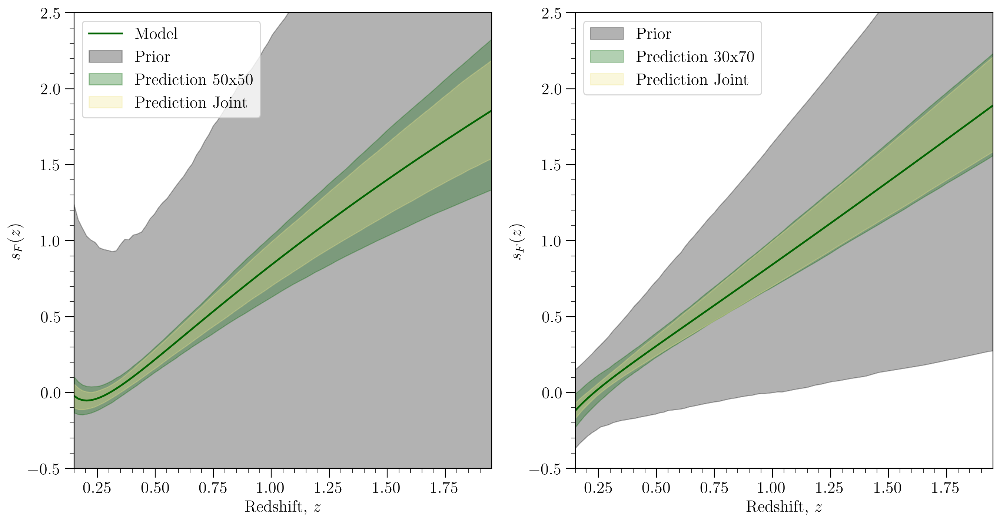

In [158]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

ax[0].plot(z_lin, sF_fid_50, '-', color = 'darkgreen', label = 'Model')
ax[0].fill_between(z_lin, sF_50_lower_bound_priors_, sF_50_upper_bound_priors_, color='black', alpha=0.3, label = 'Prior')
ax[0].fill_between(z_lin, sF_50_lower_bound, sF_50_upper_bound, color='darkgreen', alpha=0.3, label = 'Prediction 50x50')
ax[0].fill_between(z_lin, sF_50_Joint_lower_bound_, sF_50_Joint_upper_bound_, color='khaki', alpha=0.3, label = 'Prediction Joint')

ax[1].plot(z_lin, sF_fid_30, '-', color = 'darkgreen')
ax[1].fill_between(z_lin, sF_30_lower_bound_priors_, sF_30_upper_bound_priors_, color='black', alpha=0.3, label = 'Prior')
ax[1].fill_between(z_lin, sF_30_lower_bound, sF_30_upper_bound, color='darkgreen', alpha=0.3, label = 'Prediction 30x70')
ax[1].fill_between(z_lin, sF_30_Joint_lower_bound_, sF_30_Joint_upper_bound_, color='khaki', alpha=0.3, label = 'Prediction Joint')


for axi in ax:
    axi.set_xlim(0.15, 1.95)
    axi.set_ylim(-0.5, 2.5)
    axi.set_xlabel(r'Redshift, $z$')
    axi.set_ylabel(r'$s_F(z)$')
    axi.legend(loc='upper left')
    
plt.savefig("plots/sF_prediction_joint_shotnoise_vs_prior50.pdf", bbox_inches='tight', format='pdf')

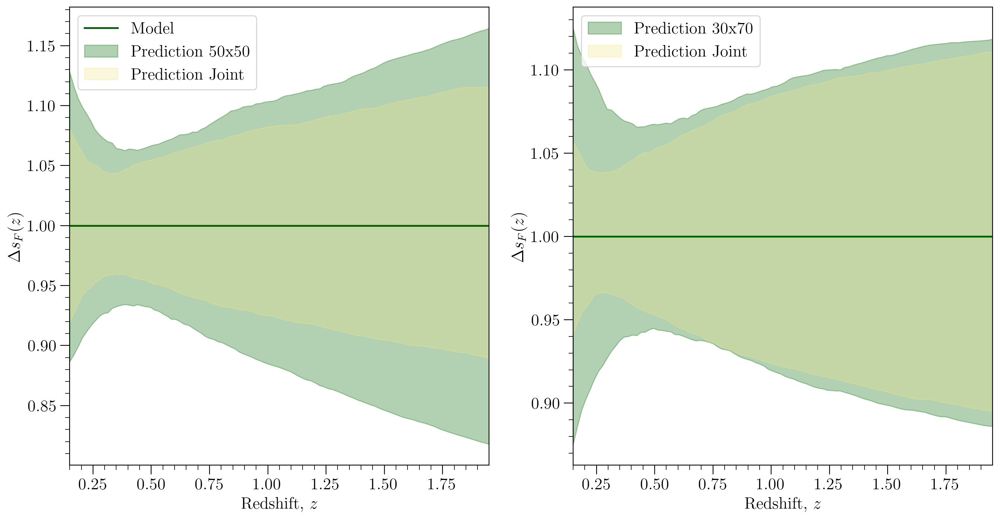

In [159]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

ax[0].plot(z_lin, sF_fid_50/sF_fid_50, '-', color = 'darkgreen', label = 'Model')
#ax[0].fill_between(z_lin, sF_50_lower_bound_priors_, sF_50_upper_bound_priors_, color='black', alpha=0.3, label = 'Prior')
ax[0].fill_between(z_lin, (sF_50_lower_bound+1)/(sF_fid_50+1), (sF_50_upper_bound+1)/(sF_fid_50+1), color='darkgreen', alpha=0.3, label = 'Prediction 50x50')
ax[0].fill_between(z_lin, (sF_50_Joint_lower_bound_+1)/(sF_fid_50+1), (sF_50_Joint_upper_bound_+1)/(sF_fid_50+1), color='khaki', alpha=0.3, label = 'Prediction Joint')

ax[1].plot(z_lin, sF_fid_30/sF_fid_30, '-', color = 'darkgreen')
#ax[1].fill_between(z_lin, sF_30_lower_bound_priors_, sF_30_upper_bound_priors_, color='black', alpha=0.3, label = 'Prior')
ax[1].fill_between(z_lin, (sF_30_lower_bound+1)/(sF_fid_30+1), (sF_30_upper_bound+1)/(sF_fid_30+1), color='darkgreen', alpha=0.3, label = 'Prediction 30x70')
ax[1].fill_between(z_lin, (sF_30_Joint_lower_bound_+1)/(sF_fid_30+1), (sF_30_Joint_upper_bound_+1)/(sF_fid_30+1), color='khaki', alpha=0.3, label = 'Prediction Joint')


for axi in ax:
    axi.set_xlim(0.15, 1.95)
    #axi.set_ylim(-1.0, 3.5)
    axi.set_xlabel(r'Redshift, $z$')
    axi.set_ylabel(r'$\Delta s_F(z)$')
    axi.legend(loc='upper left')

## Number evolution

In [160]:
def nevol_fit(params, x):
    a, b, c, d = params
    return a + b * x + c * (1/x) + d * np.exp(-x)

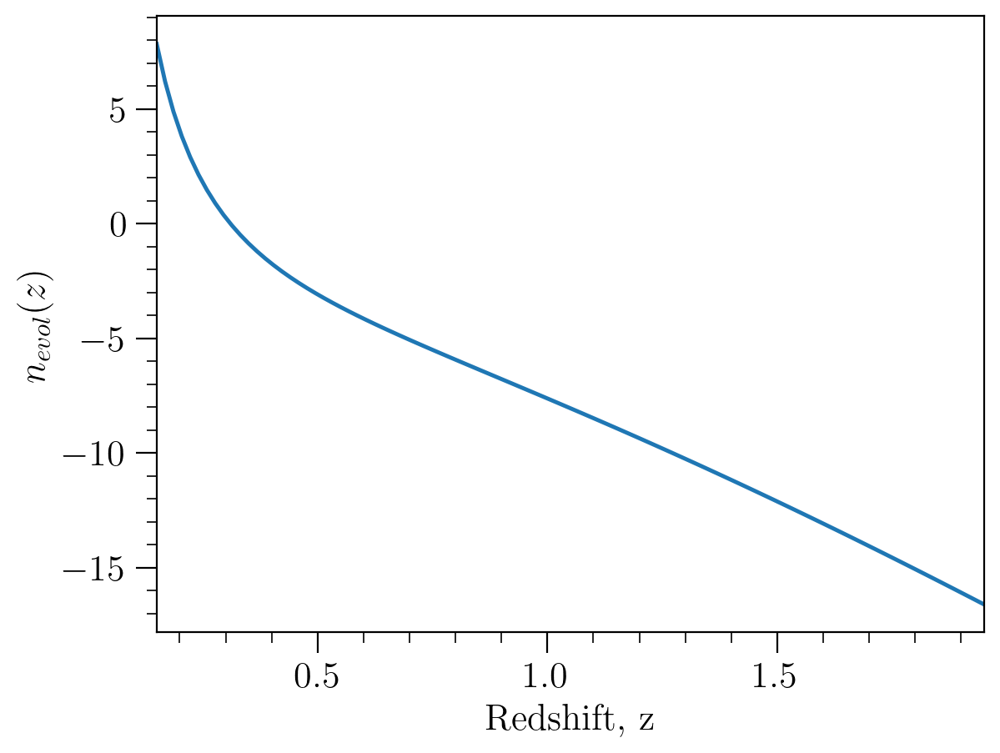

In [161]:
z_lin = np.linspace(z_bins[0], z_bins[-1], 100)
m_split = 2.

num_evol_fid = nevol_fit(num_fit, z_lin)

plt.plot(z_lin, num_evol_fid, '-')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z');
plt.ylabel(r'$n_{evol}(z)$');
#plt.title('Fitting model for the number desnsitiy evolution');

In [162]:
# Select the marginalized covariance matrix for the number evolution

cov_50_numevol = Sigma_Matrix_50[8:12,8:12]
cov_30_numevol = Sigma_Matrix_30[8:12,8:12]



# Generate parameter samples from multivariate normal distribution

##np.random.seed(36)

num_samples = 1000
nevol_50_pars_samples = np.random.multivariate_normal(num_fit, cov_50_numevol, num_samples)
nevol_30_pars_samples = np.random.multivariate_normal(num_fit, cov_30_numevol, num_samples)


# Evaluate fitting function for each parameter sample
nevol_50_samples = np.array([nevol_fit(pars, z_lin) for pars in nevol_50_pars_samples])
nevol_30_samples = np.array([nevol_fit(pars, z_lin) for pars in nevol_30_pars_samples])

# Calculate the 68% confidence interval
nevol_50_lower_bound = np.percentile(nevol_50_samples, 16, axis=0)
nevol_50_upper_bound = np.percentile(nevol_50_samples, 84, axis=0)
nevol_30_lower_bound = np.percentile(nevol_30_samples, 16, axis=0)
nevol_30_upper_bound = np.percentile(nevol_30_samples, 84, axis=0)


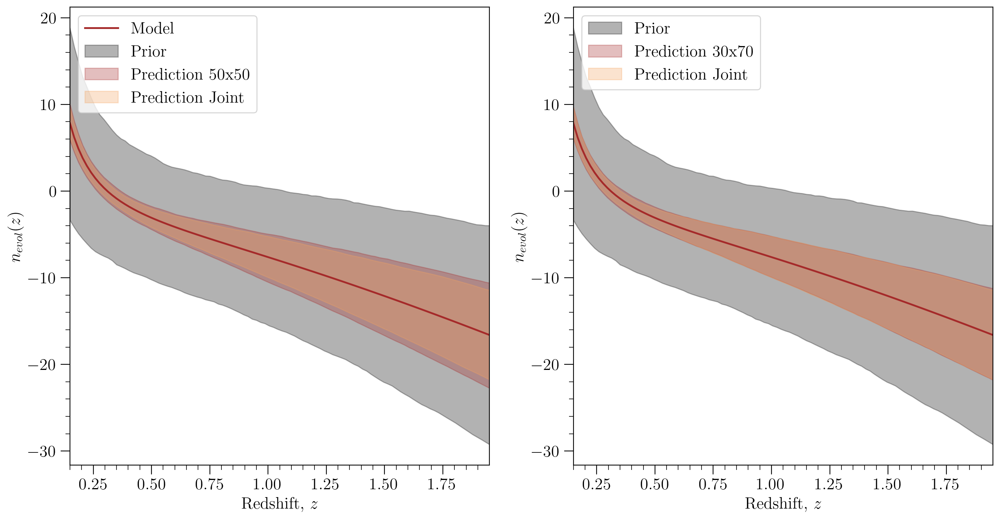

In [163]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

ax[0].plot(z_lin, num_evol_fid, '-', color = 'brown', label = 'Model')
ax[0].fill_between(z_lin, nevol_lower_bound_priors, nevol_upper_bound_priors, color='black', alpha=0.3, label = 'Prior')
ax[0].fill_between(z_lin, nevol_50_lower_bound, nevol_50_upper_bound, color='brown', alpha=0.3, label = 'Prediction 50x50')
ax[0].fill_between(z_lin, nevol_Joint_lower_bound, nevol_Joint_upper_bound, color='sandybrown', alpha=0.3, label = 'Prediction Joint')

ax[1].plot(z_lin, num_evol_fid, '-', color = 'brown')
ax[1].fill_between(z_lin, nevol_lower_bound_priors, nevol_upper_bound_priors, color='black', alpha=0.3, label = 'Prior')
ax[1].fill_between(z_lin, nevol_30_lower_bound, nevol_30_upper_bound, color='brown', alpha=0.3, label = 'Prediction 30x70')
ax[1].fill_between(z_lin, nevol_Joint_lower_bound, nevol_Joint_upper_bound, color='sandybrown', alpha=0.3, label = 'Prediction Joint')


for axi in ax:
    axi.set_xlim(0.15, 1.95)
    axi.set_xlabel(r'Redshift, $z$')
    axi.set_ylabel(r'$n_{evol}(z)$')
    axi.legend(loc='upper left')
    
plt.savefig("plots/nevol_prediction_joint_shotnoise_vs_prior50.pdf", bbox_inches='tight', format='pdf')

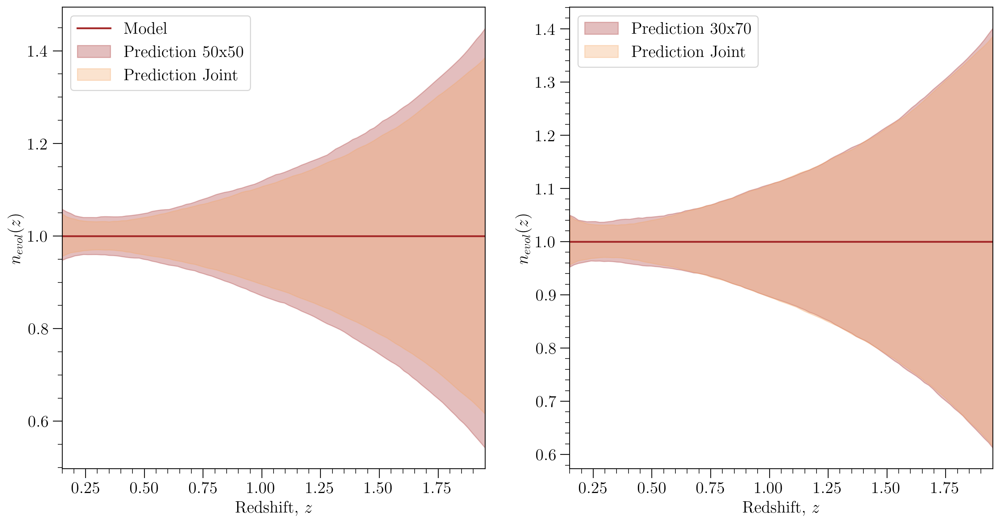

In [164]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

ax[0].plot(z_lin, num_evol_fid/num_evol_fid, '-', color = 'brown', label = 'Model')
#ax[0].fill_between(z_lin, nevol_lower_bound_priors, nevol_upper_bound_priors, color='black', alpha=0.3, label = 'Prior')
ax[0].fill_between(z_lin, (nevol_50_lower_bound+30)/(num_evol_fid+30), (nevol_50_upper_bound+30)/(num_evol_fid+30), color='brown', alpha=0.3, label = 'Prediction 50x50')
ax[0].fill_between(z_lin, (nevol_Joint_lower_bound+30)/(num_evol_fid+30), (nevol_Joint_upper_bound+30)/(num_evol_fid+30), color='sandybrown', alpha=0.3, label = 'Prediction Joint')

ax[1].plot(z_lin, num_evol_fid/num_evol_fid, '-', color = 'brown')
#ax[1].fill_between(z_lin, nevol_lower_bound_priors, nevol_upper_bound_priors, color='black', alpha=0.3, label = 'Prior')
ax[1].fill_between(z_lin, (nevol_30_lower_bound+30)/(num_evol_fid+30), (nevol_30_upper_bound+30)/(num_evol_fid+30), color='brown', alpha=0.3, label = 'Prediction 30x70')
ax[1].fill_between(z_lin, (nevol_Joint_lower_bound+30)/(num_evol_fid+30), (nevol_Joint_upper_bound+30)/(num_evol_fid+30), color='sandybrown', alpha=0.3, label = 'Prediction Joint')


for axi in ax:
    axi.set_xlim(0.15, 1.95)
    axi.set_xlabel(r'Redshift, $z$')
    axi.set_ylabel(r'$n_{evol}(z)$')
    axi.legend(loc='upper left')

## Evolution bias

The evolution bias is computed from the magnification biases and the evolution of the number densities.

$$ f^{evol}_{B}(z) = -\frac{d\log{N_B(z)}}{d\log{(1+z)}} - \frac{d\log{H(z)}}{d\log{(1+z)}} + \frac{2(1+z)}{r(z)H(z)} -5\,s_B(z)\left(1+\frac{(1+z)}{r(z)H(z)}\right) - \frac{5}{2}s_B(z)\,\frac{d\log{F_c}}{d\log{(1+z)}} $$

$$ f^{evol}_{F}(z) = -\frac{d\log{N_F(z)}}{d\log{(1+z)}} - \frac{d\log{H(z)}}{d\log{(1+z)}} + \frac{2(1+z)}{r(z)H(z)} -5\,s_F(z)\left(1+\frac{(1+z)}{r(z)H(z)}\right) 
    - \frac{5}{2}\left[\frac{\bar{N}}{\bar{N}_F}\,s_{model}(z)\frac{d\log{F_*}}{d\log{(1+z)}}-\frac{\bar{N}_B}{\bar{N}_F}\,s_B(z)\frac{d\log{F_c}}{d\log{(1+z)}}\right] $$

We have all the ingredients defined as methods in the EvolutionBias class. We need to extract the relevant terms and then sample togeter the $n_{evol}$ and magnification bias parameters to construct the predictions for each evolution bias. 

In [186]:
from biasmodels import EvolutionBias

In [187]:
myEvolBias_50 = EvolutionBias(n_split=m_50)
myEvolBias_30 = EvolutionBias(n_split=m_30)


dlogH = myEvolBias_50.dlogH
rHterm = myEvolBias_50.rHterm
dFstar = myEvolBias_50.dLogFstar
dFcut = myEvolBias_50.dLogFcut

In [188]:
def fevol_bright(pars_s, pars_n, z):
    pars_sB = pars_s[:4] 
    return - nevol_fit(params=pars_n, x=z) - dlogH(z) + (2 - 5*magbias_fit(params=pars_sB, x=z))*rHterm(z) - 5*magbias_fit(params=pars_sB, x=z) - 5/2*magbias_fit(params=pars_sB, x=z)*dFcut(z)
    
def fevol_faint(pars_s, pars_n, z):
    
    pars_sB = pars_s[:4]
    pars_sM = pars_s[4:]
    s_B = magbias_fit(params=pars_sB, x=z)
    s_M = magbias_fit(params=pars_sM, x=z)
    s_faint = s_M*m_split/(m_split-1) - s_B/(m_split-1)
    
    return - nevol_fit(params=pars_n, x=z) - dlogH(z) + (2 - 5*s_faint)*rHterm(z) - 5*s_faint + 5/2*((1/(m_split-1)) * s_B *dFcut(z) - (m_split/(m_split-1)) * s_M *dFstar(z))

In [189]:
sbias_fid_50 = np.concatenate([sB_4fit50, sM_4fit])
sbias_fid_30 = np.concatenate([sB_4fit30, sM_4fit])

np.shape(sbias_fid_50), np.shape(sbias_fid_30)

((8,), (8,))

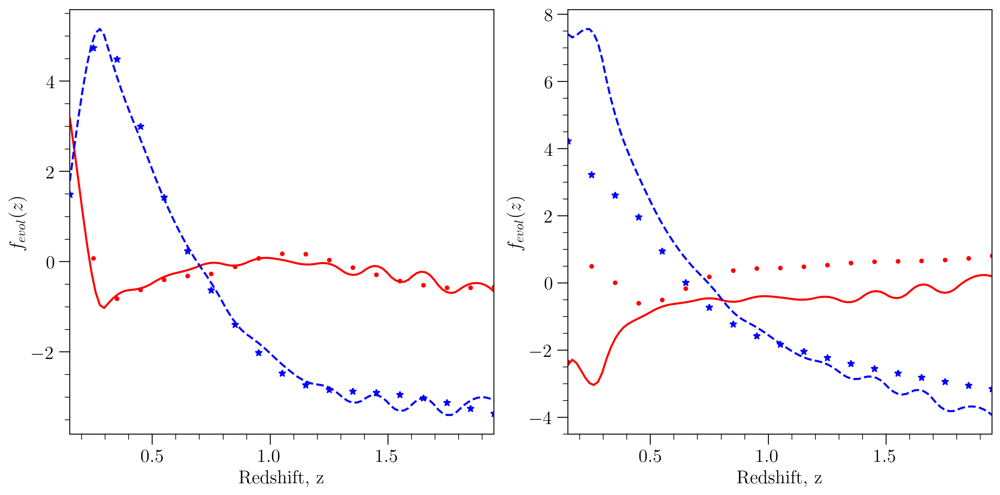

In [190]:
z_lin = np.linspace(z_bins[0], z_bins[-1], 100)

fevol_50_B_fid = fevol_bright(pars_s = sbias_fid_50, pars_n = num_fit, z = z_lin)
fevol_50_F_fid = fevol_faint(pars_s = sbias_fid_50, pars_n = num_fit, z = z_lin)

fevol_30_B_fid = fevol_bright(pars_s = sbias_fid_30, pars_n = num_fit, z = z_lin)
fevol_30_F_fid = fevol_faint(pars_s = sbias_fid_30, pars_n = num_fit, z = z_lin)

feB_50 = myEvolBias_50.fevol_bright(z_bins)
feF_50 = myEvolBias_50.fevol_faint(z_bins)

feB_30 = myEvolBias_30.fevol_bright(z_bins)
feF_30 = myEvolBias_30.fevol_faint(z_bins)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6), tight_layout=True)

ax[0].plot(z_lin, fevol_50_B_fid, 'r-')
ax[0].plot(z_lin, fevol_50_F_fid, 'b--')
ax[0].plot(z_bins, feB_50, 'r.', label='Bright')
ax[0].plot(z_bins, feF_50, 'b*', label='Faint')

ax[1].plot(z_lin, fevol_30_B_fid, 'r-')
ax[1].plot(z_lin, fevol_30_F_fid, 'b--')
ax[1].plot(z_bins, feB_30, 'r.', label='Bright')
ax[1].plot(z_bins, feF_30, 'b*', label='Faint')

for axi in ax:
    axi.set_xlim(z_bins[0],z_bins[-1])
    axi.set_xlim(z_bins[0],z_bins[-1])
    axi.set_xlabel(r'Redshift, z');
    axi.set_ylabel(r'$f_{evol}(z)$');

In [191]:
all_50_fid = np.concatenate([sB_4fit50, sM_4fit, num_fit])
all_30_fid = np.concatenate([sB_4fit30, sM_4fit, num_fit])

np.shape(all_50_fid), np.shape(all_30_fid)

((12,), (12,))

In [197]:
# Select the marginalized covariance matrix for the parameters

cov_50_all = Sigma_Matrix_50[:12, :12]
cov_30_all = Sigma_Matrix_30[:12, :12]
cov_50_priors = Cov_priors_50[:12, :12]
cov_30_priors = Cov_priors_30[:12, :12]

# Generate parameter samples from multivariate normal distribution

##np.random.seed(36)

num_samples = 1000

all_50_pars_samples = np.random.multivariate_normal(all_50_fid, cov_50_all, num_samples)
all_50_pars_samples_priors_ = np.random.multivariate_normal(all_50_fid, cov_50_priors, num_samples)
all_30_pars_samples = np.random.multivariate_normal(all_30_fid, cov_30_all, num_samples)
all_30_pars_samples_priors_ = np.random.multivariate_normal(all_30_fid, cov_30_priors, num_samples)

In [198]:
# Evaluate fitting function for each parameter sample

fevol_50_B_samples = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_50_pars_samples])
fevol_50_B_samples_priors_ = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_50_pars_samples_priors_])
fevol_50_F_samples = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_50_pars_samples])
fevol_50_F_samples_priors_ = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_50_pars_samples_priors_])

fevol_30_B_samples = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_30_pars_samples])
fevol_30_B_samples_priors_ = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_30_pars_samples_priors_])
fevol_30_F_samples = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_30_pars_samples])
fevol_30_F_samples_priors_ = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_30_pars_samples_priors_])

# Calculate the 68% confidence intervals

fevol_B_50_lower_bound_ = np.percentile(fevol_50_B_samples, 16, axis=0)
fevol_B_50_upper_bound_ = np.percentile(fevol_50_B_samples, 84, axis=0)
fevol_B_50_lower_bound_priors_ = np.percentile(fevol_50_B_samples_priors_, 16, axis=0)
fevol_B_50_upper_bound_priors_ = np.percentile(fevol_50_B_samples_priors_, 84, axis=0)

fevol_F_50_lower_bound_ = np.percentile(fevol_50_F_samples, 16, axis=0)
fevol_F_50_upper_bound_ = np.percentile(fevol_50_F_samples, 84, axis=0)
fevol_F_50_lower_bound_priors_ = np.percentile(fevol_50_F_samples_priors_, 16, axis=0)
fevol_F_50_upper_bound_priors_ = np.percentile(fevol_50_F_samples_priors_, 84, axis=0)

fevol_B_30_lower_bound_ = np.percentile(fevol_30_B_samples, 16, axis=0)
fevol_B_30_upper_bound_ = np.percentile(fevol_30_B_samples, 84, axis=0)
fevol_B_30_lower_bound_priors_ = np.percentile(fevol_30_B_samples_priors_, 16, axis=0)
fevol_B_30_upper_bound_priors_ = np.percentile(fevol_30_B_samples_priors_, 84, axis=0)

fevol_F_30_lower_bound_ = np.percentile(fevol_30_F_samples, 16, axis=0)
fevol_F_30_upper_bound_ = np.percentile(fevol_30_F_samples, 84, axis=0)
fevol_F_30_lower_bound_priors_ = np.percentile(fevol_30_F_samples_priors_, 16, axis=0)
fevol_F_30_upper_bound_priors_ = np.percentile(fevol_30_F_samples_priors_, 84, axis=0)

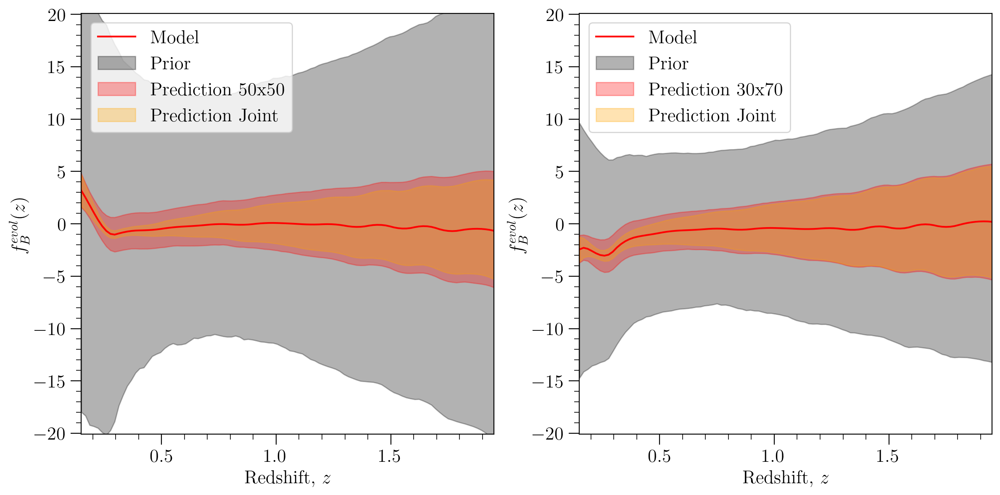

In [179]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6), tight_layout=True)

ax[0].plot(z_lin, fevol_50_B_fid, '-', color='red', lw = 1.5, label = 'Model')
#ax[0].plot(z_bins, feB_50, '*', color='black')
ax[1].plot(z_lin, fevol_30_B_fid, '-', color='red', lw = 1.5, label = 'Model')
#ax[1].plot(z_bins, feB_30, '*', color='black')

# Shade the 68% confidence interval

ax[0].fill_between(z_lin, fevol_B_50_lower_bound_priors, fevol_B_50_upper_bound_priors, color='black', alpha=0.3, label = 'Prior')
ax[0].fill_between(z_lin, fevol_B_50_lower_bound_, fevol_B_50_upper_bound_, color='red', alpha=0.3, label = 'Prediction 50x50')
ax[0].fill_between(z_lin, fevol_B_50_lower_bound, fevol_B_50_upper_bound, color='orange', alpha=0.3, label = 'Prediction Joint')

ax[1].fill_between(z_lin, fevol_B_30_lower_bound_priors, fevol_B_30_upper_bound_priors, color='black', alpha=0.3, label = 'Prior')
ax[1].fill_between(z_lin, fevol_B_30_lower_bound_, fevol_B_30_upper_bound_, color='red', alpha=0.3, label = 'Prediction 30x70')
ax[1].fill_between(z_lin, fevol_B_30_lower_bound, fevol_B_30_upper_bound, color='orange', alpha=0.3, label = 'Prediction Joint')

for axi in ax:
    axi.set_xlim(0.15,1.95)
    axi.set_ylim(-20.1, 20.1)
    axi.set_xlabel(r'Redshift, $z$')
    axi.set_ylabel(r'$f^{evol}_B(z)$')
    axi.legend(loc='upper left')
    
plt.savefig("plots/fevolB_prediction_joint_shotnoise_vs_prior50.pdf", bbox_inches='tight', format='pdf')

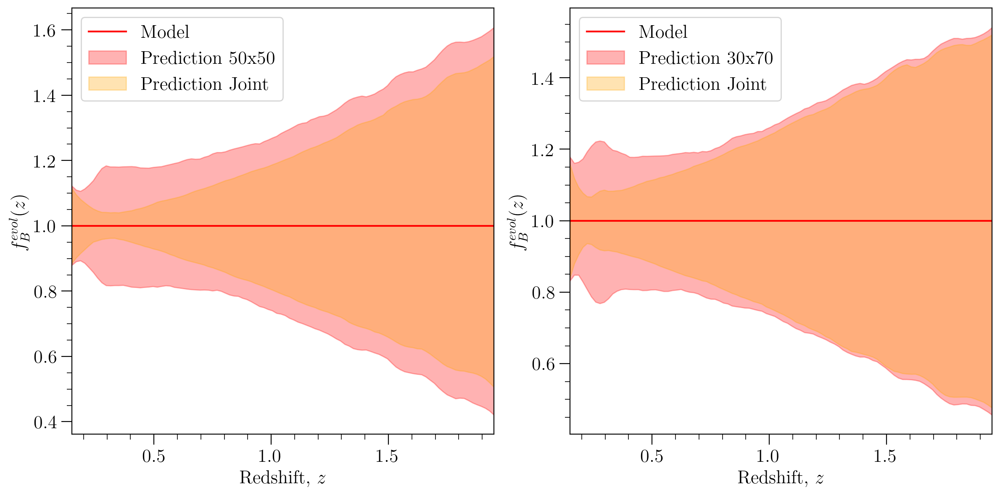

In [180]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6), tight_layout=True)

ax[0].plot(z_lin, fevol_50_B_fid/fevol_50_B_fid, '-', color='red', lw = 1.5, label = 'Model')
#ax[0].plot(z_bins, feB_50, '*', color='black')
ax[1].plot(z_lin, fevol_30_B_fid/fevol_30_B_fid, '-', color='red', lw = 1.5, label = 'Model')
#ax[1].plot(z_bins, feB_30, '*', color='black')

# Shade the 68% confidence interval

#ax[0].fill_between(z_lin, fevol_B_50_lower_bound_priors, fevol_B_50_upper_bound_priors, color='black', alpha=0.3, label = 'Prior')
ax[0].fill_between(z_lin, (fevol_B_50_lower_bound_+10)/(fevol_50_B_fid+10), (fevol_B_50_upper_bound_+10)/(fevol_50_B_fid+10), color='red', alpha=0.3, label = 'Prediction 50x50')
ax[0].fill_between(z_lin, (fevol_B_50_lower_bound+10)/(fevol_50_B_fid+10), (fevol_B_50_upper_bound+10)/(fevol_50_B_fid+10), color='orange', alpha=0.3, label = 'Prediction Joint')

#ax[1].fill_between(z_lin, fevol_B_30_lower_bound_priors, fevol_B_30_upper_bound_priors, color='black', alpha=0.3, label = 'Prior')
ax[1].fill_between(z_lin, (fevol_B_30_lower_bound_+10)/(fevol_30_B_fid+10), (fevol_B_30_upper_bound_+10)/(fevol_30_B_fid+10), color='red', alpha=0.3, label = 'Prediction 30x70')
ax[1].fill_between(z_lin, (fevol_B_30_lower_bound+10)/(fevol_30_B_fid+10), (fevol_B_30_upper_bound+10)/(fevol_30_B_fid+10), color='orange', alpha=0.3, label = 'Prediction Joint')

for axi in ax:
    axi.set_xlim(0.15,1.95)
    #axi.set_ylim(-20, 20)
    axi.set_xlabel(r'Redshift, $z$')
    axi.set_ylabel(r'$f^{evol}_B(z)$')
    axi.legend(loc='upper left')

In [181]:
from scipy.interpolate import interp1d

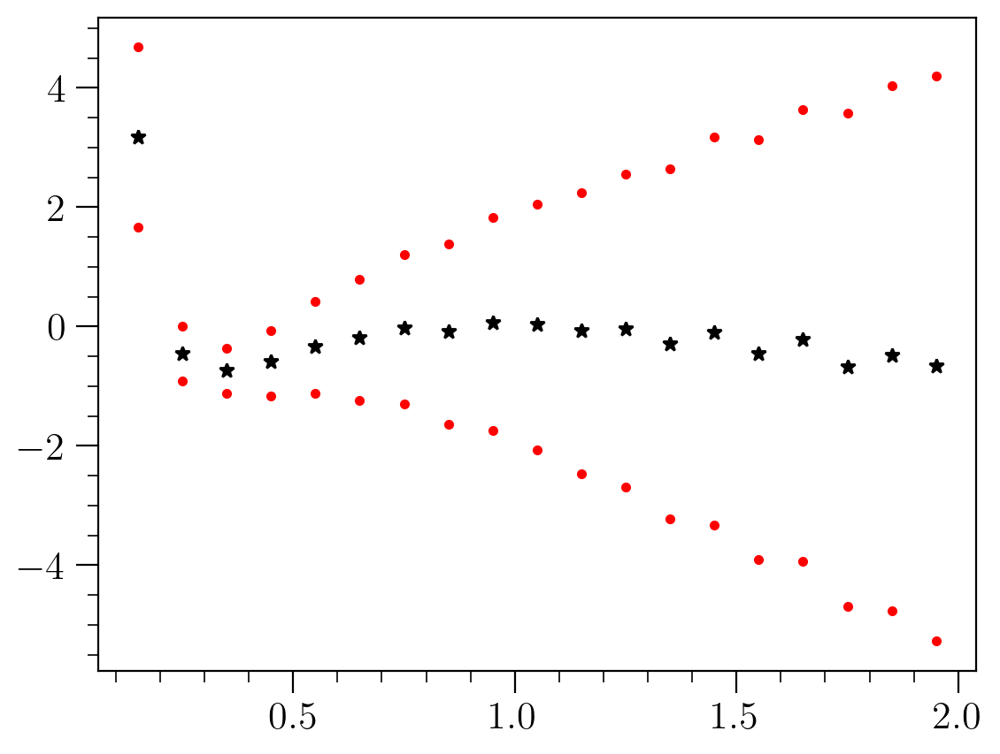

In [182]:
fevol_50_int = interp1d(z_lin,fevol_50_B_fid, kind='cubic', fill_value='extrapolate')
fevol_50_lb_int = interp1d(z_lin,fevol_B_50_lower_bound, kind='cubic', fill_value='extrapolate')
fevol_50_ub_int = interp1d(z_lin,fevol_B_50_upper_bound, kind='cubic', fill_value='extrapolate')

plt.plot(z_bins, fevol_50_int(z_bins), 'k*')
plt.plot(z_bins, fevol_50_lb_int(z_bins), 'r.')
plt.plot(z_bins, fevol_50_ub_int(z_bins), 'r.')


<ErrorbarContainer object of 3 artists>

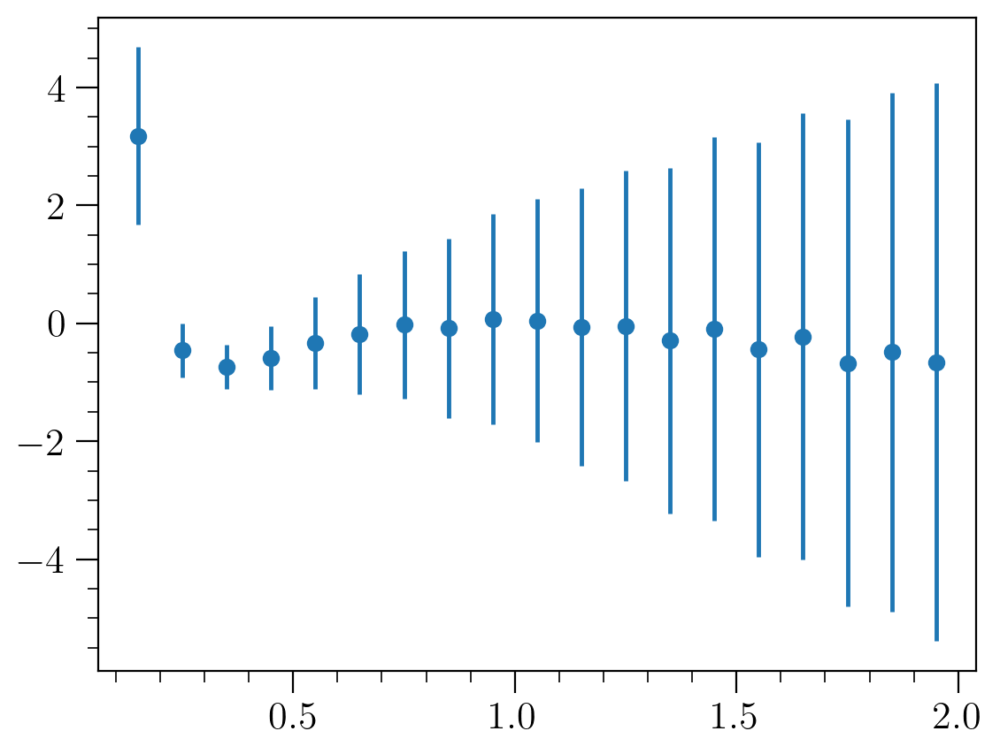

In [183]:
plt.errorbar(z_bins, fevol_50_int(z_bins), yerr=np.abs((fevol_50_ub_int(z_bins)-fevol_50_lb_int(z_bins))/2), fmt='o')


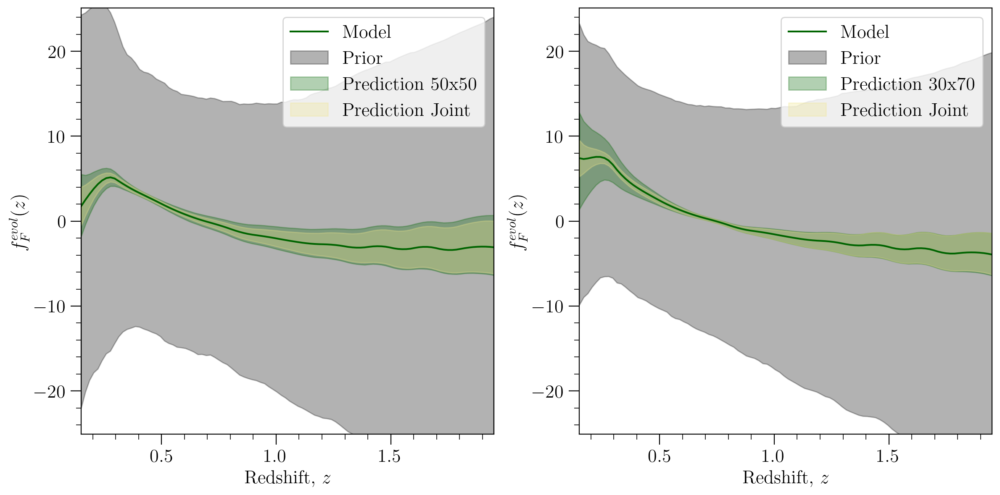

In [199]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6), tight_layout=True)

ax[0].plot(z_lin, fevol_50_F_fid, '-', color='darkgreen', lw = 1.5, label = 'Model')
#ax[0].plot(z_bins, feF_50, '*', color='black')
ax[1].plot(z_lin, fevol_30_F_fid, '-', color='darkgreen', lw = 1.5, label ='Model')
#ax[1].plot(z_bins, feF_30, '*', color='black')

# Shade the 68% confidence interval
ax[0].fill_between(z_lin, fevol_F_50_lower_bound_priors, fevol_F_50_upper_bound_priors, color='black', alpha=0.3, label = 'Prior')
ax[0].fill_between(z_lin, fevol_F_50_lower_bound_, fevol_F_50_upper_bound_, color='darkgreen', alpha=0.3, label = 'Prediction 50x50')
ax[0].fill_between(z_lin, fevol_F_50_lower_bound, fevol_F_50_upper_bound, color='khaki', alpha=0.3, label = 'Prediction Joint')


ax[1].fill_between(z_lin, fevol_F_30_lower_bound_priors, fevol_F_30_upper_bound_priors, color='black', alpha=0.3, label = 'Prior')
ax[1].fill_between(z_lin, fevol_F_30_lower_bound_, fevol_F_30_upper_bound_, color='darkgreen', alpha=0.3, label = 'Prediction 30x70')
ax[1].fill_between(z_lin, fevol_F_30_lower_bound, fevol_F_30_upper_bound, color='khaki', alpha=0.3, label = 'Prediction Joint')


for axi in ax:
    axi.set_xlim(0.15,1.95)
    axi.set_ylim(-25.1, 25.1)
    axi.set_xlabel(r'Redshift, $z$')
    axi.set_ylabel(r'$f^{evol}_F(z)$')
    axi.legend(loc='upper right')
    
plt.savefig("plots/fevolF_prediction_joint_shotnoise_vs_prior50.pdf", bbox_inches='tight', format='pdf')

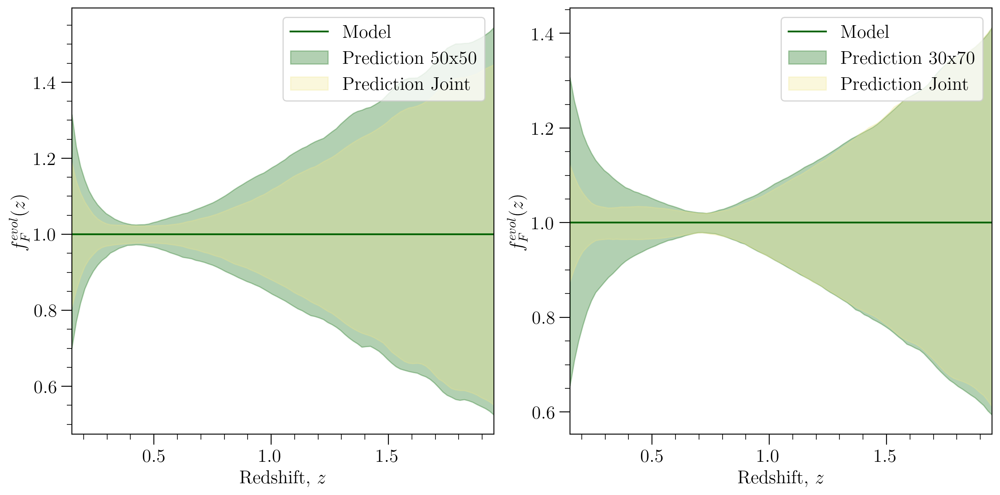

In [200]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6), tight_layout=True)

ax[0].plot(z_lin, fevol_50_F_fid/fevol_50_F_fid, '-', color='darkgreen', lw = 1.5, label = 'Model')
#ax[0].plot(z_bins, feF_50, '*', color='black')
ax[1].plot(z_lin, fevol_30_F_fid/fevol_30_F_fid, '-', color='darkgreen', lw = 1.5, label ='Model')
#ax[1].plot(z_bins, feF_30, '*', color='black')

shift = 10

# Shade the 68% confidence interval
#ax[0].fill_between(z_lin, fevol_F_50_lower_bound_priors, fevol_F_50_upper_bound_priors, color='black', alpha=0.3, label = 'Prior')
ax[0].fill_between(z_lin, (fevol_F_50_lower_bound_ + shift)/(fevol_50_F_fid + shift), (fevol_F_50_upper_bound_ + shift)/(fevol_50_F_fid + shift), color='darkgreen', alpha=0.3, label = 'Prediction 50x50')
ax[0].fill_between(z_lin, (fevol_F_50_lower_bound + shift)/(fevol_50_F_fid + shift), (fevol_F_50_upper_bound + shift)/(fevol_50_F_fid+shift), color='khaki', alpha=0.3, label = 'Prediction Joint')


#ax[1].fill_between(z_lin, fevol_F_30_lower_bound_priors, fevol_F_30_upper_bound_priors, color='black', alpha=0.3, label = 'Prior')
ax[1].fill_between(z_lin, (fevol_F_30_lower_bound_ + shift)/(fevol_30_F_fid + shift), (fevol_F_30_upper_bound_ + shift)/(fevol_30_F_fid + shift), color='darkgreen', alpha=0.3, label = 'Prediction 30x70')
ax[1].fill_between(z_lin, (fevol_F_30_lower_bound + shift)/(fevol_30_F_fid + shift), (fevol_F_30_upper_bound + shift)/(fevol_30_F_fid + shift), color='khaki', alpha=0.3, label = 'Prediction Joint')


for axi in ax:
    axi.set_xlim(0.15,1.95)
    #axi.set_ylim(-20, 20)
    axi.set_xlabel(r'Redshift, $z$')
    axi.set_ylabel(r'$f^{evol}_F(z)$')
    axi.legend(loc='upper right')

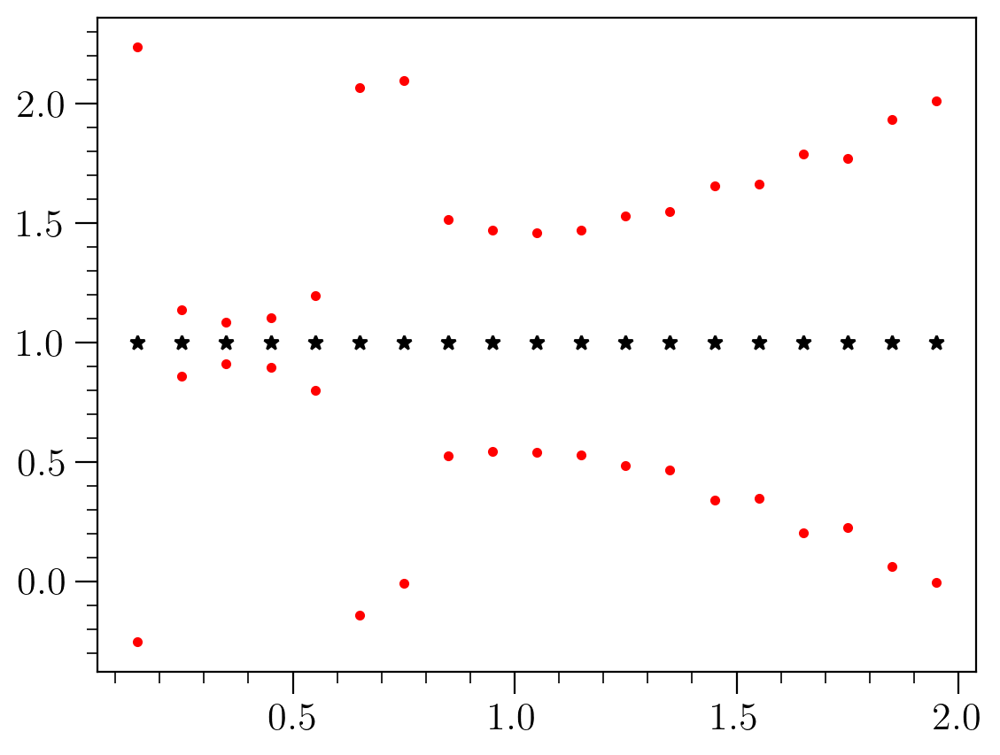

In [201]:
fevol_50_int = interp1d(z_lin,fevol_50_F_fid, kind='cubic', fill_value='extrapolate')
fevol_50_lb_int = interp1d(z_lin,fevol_F_50_lower_bound, kind='cubic', fill_value='extrapolate')
fevol_50_ub_int = interp1d(z_lin,fevol_F_50_upper_bound, kind='cubic', fill_value='extrapolate')

plt.plot(z_bins, fevol_50_int(z_bins)/fevol_50_int(z_bins), 'k*')
plt.plot(z_bins, fevol_50_lb_int(z_bins)/fevol_50_int(z_bins), 'r.')
plt.plot(z_bins, fevol_50_ub_int(z_bins)/fevol_50_int(z_bins), 'r.')


<ErrorbarContainer object of 3 artists>

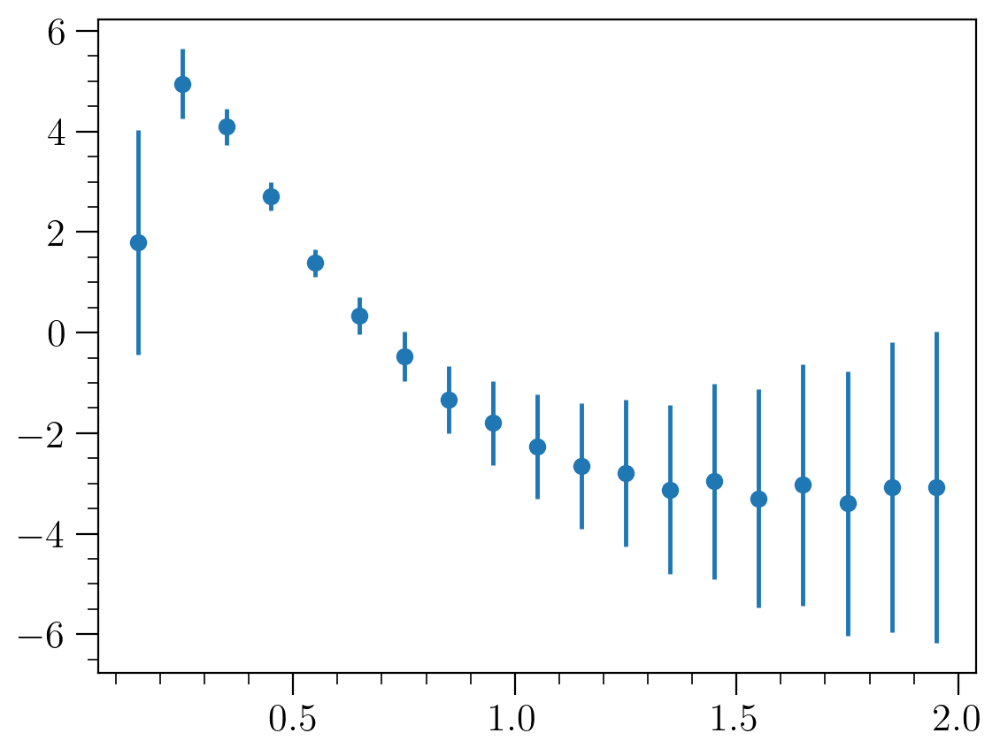

In [202]:
plt.errorbar(z_bins, fevol_50_int(z_bins), yerr=np.abs((fevol_50_ub_int(z_bins)-fevol_50_lb_int(z_bins))/2), fmt='o')


## WIDTHS 

In [203]:
# Compute the PRIORS regions WIDTHS

sB_50_prior_width = sB_50_upper_bound_priors - sB_50_upper_bound_priors
sB_30_prior_width = sB_30_upper_bound_priors - sB_30_upper_bound_priors

sM_50_prior_width = sM_upper_bound_priors - sM_lower_bound_priors
nevol_prior_width = nevol_upper_bound_priors - nevol_lower_bound_priors

fevol_B_50_prior_width = fevol_B_50_upper_bound_priors - fevol_B_50_lower_bound_priors
fevol_B_30_prior_width = fevol_B_30_upper_bound_priors - fevol_B_30_lower_bound_priors

fevol_F_50_prior_width = fevol_F_50_upper_bound_priors - fevol_F_50_lower_bound_priors
fevol_F_30_prior_width = fevol_F_30_upper_bound_priors - fevol_F_30_lower_bound_priors